In [ ]:
import sys
import os
current_path = os.path.abspath(os.getcwd())
sys.path.append(os.path.join(current_path, os.pardir, 'Class'))

from Dataset_function import *
from Preprocess import *
from TopicModel import *
from LdaAnalysis import *
from Inference import *
from Similarity import *

In [2]:
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from scipy import stats
from scipy.stats import shapiro

/home/stsapoui/Project/env/lib/python3.8/site-packages/patsy/constraint.py:13: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  from collections import Mapping


In [3]:
data_train, abstract_train, body_train, data_val, abstract_val, body_val = extract_Paper("CiteSeerX")

oai:CiteSeerX.psu:10.1.1.1.6092 not found


In [4]:
data_eval, abstract_eval, body_eval = extract_Evaluation()

arXiv:2010.10614 not found
arXiv:2011.01098 not found
arXiv:2011.10319 not found
arXiv:2101.05177 not found
arXiv:2103.04283 not found
arXiv:2103.07395 not found
arXiv:2104.04604 not found
arXiv:2105.06877 not found
arXiv:2106.00844 not found
arXiv:2106.01726 not found
arXiv:2106.10081 not found
arXiv:2107.01621 not found
arXiv:2107.02679 not found
arXiv:2107.08921 not found
arXiv:2107.09333 not found
arXiv:2107.11834 not found


In [5]:
data_eval

,Title,Author,Date,Journal,Field,Classification
arXiv:1506.02082,A Real-time Cargo Damage Management System via...,"{""Philip B. Alipour"",""Matteus Magnusson"",""Mart...",None,None,computer,[cs.AI]
arXiv:1810.06992,Topographic Representation for Quantum Machine...,"{""Bruce MacLennan""}",None,None,computer,"[cs.LG, quant-ph, stat.ML]"
arXiv:2005.06964,Big Computing: Where are we heading,"{""Sabuzima Nayak"",""Ripon Patgiri"",""Thoudam Dor...",None,None,computer,[cs.DC]
arXiv:2005.07531,6G Communications: A Vision on the Potential A...,"{""Sabuzima Nayak"",""Ripon Patgiri""}",None,None,computer,[cs.NI]
arXiv:2006.02107,KCN: Knowledge Centric Networking,"{""Marinos Charalambides"",""Daphne Tuncer"",""Ning...",None,None,computer,[cs.NI]
...,...,...,...,...,...,...
arXiv:2107.13066,Removing Operational Friction Using Process Mi...,"{""Wil van der Aalst"",""Tobias Brockhoff"",""Anahi...",None,None,computer,"[cs.DB, cs.LG]"
arXiv:2107.13069,Tensor diagrams and cluster combinatorics at p...,"{""Chris Fraser"",""Pavlo Pylyavskyy""}",None,None,math,[math.CO]
arXiv:2107.13299,Trees and Homogeneous LOTS,"{""Ethan Akin"",""Karel Hrbacek""}",None,None,math,"[math.GN, math.DS]"
arXiv:2107.13320,A Case Study on the Stability of Performance T...,"{""Simon Eismann"",""Diego Elias Costa"",""Lizhi Li...",None,None,computer,"[cs.DC, cs.SE]"


In [7]:
body_eval3 = Preprocessing3("body_eval3",body_eval,list(data_eval.index))
body_eval3.execute()

Time to train the last preprocessing : 154.68212270736694 sec


In [8]:
abstract_eval3 = Preprocessing3("abstract_eval3",abstract_eval,list(data_eval.index))
abstract_eval3.execute()

Time to train the last preprocessing : 2.83001446723938 sec


In [9]:
body_eval3.save("Saved Data")
abstract_eval3.save("Saved Data")

In [6]:
body_eval3 = Preprocessing3('body_eval3')
body_eval3.load('Saved Data/body_eval3.pickle')

abstract_eval3 = Preprocessing3('abstract_eval3')
abstract_eval3.load('Saved Data/abstract_eval3.pickle')

In [7]:
body_eval3.create_dictionary()
print(body_eval3.get_dictionary())
abstract_eval3.create_dictionary()
print(abstract_eval3.get_dictionary())

Dictionary(52475 unique tokens: ['10fig', '1fig1', '1the', '2fig', '2phasecontainers']...)
Dictionary(4783 unique tokens: ['actuallydamaged', 'agent', 'array', 'assume', 'calculate']...)


In [8]:
final_lda_body3 = LDAMallet("final_lda_body3", _)
final_lda_body3.load("Saved Data/final_lda_body3.pickle")

final_lda_abstract3_v2 = LDAMallet("final_lda_abstract3_v2", _)
final_lda_abstract3_v2.load("Saved Data/final_lda_abstract3_v2.pickle")

In [13]:
inference_body_eval3 = Inference('inference_body_eval3', final_lda_body3, body_eval3) 

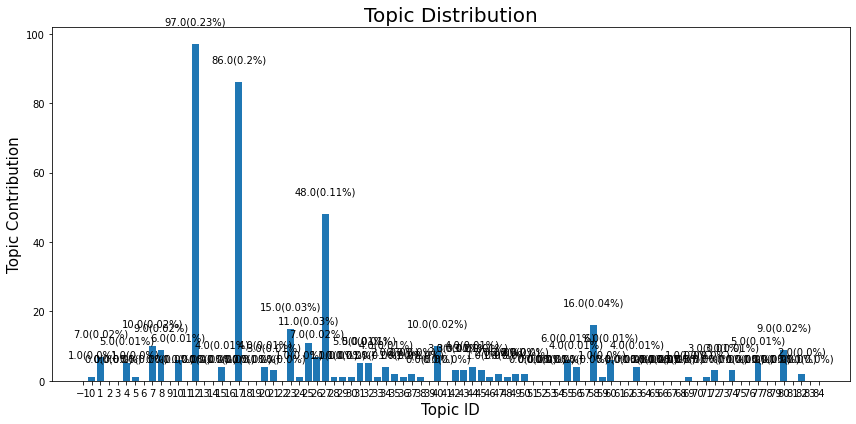

In [14]:
inference_body_eval3.get_model().topic_repartition()

In [15]:
inference_body_eval3.save("Saved Data")

In [9]:
inference_abstract_eval3_v2 = Inference('inference_abstract_eval3_v2', final_lda_abstract3_v2, abstract_eval3) 

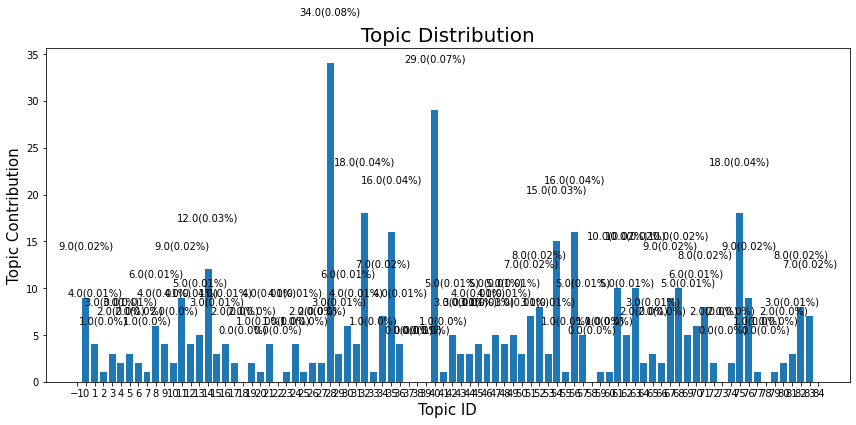

In [10]:
inference_abstract_eval3_v2.get_model().topic_repartition()

In [11]:
inference_abstract_eval3_v2.save("Saved Data")

### Start to run here

In [5]:
body_eval3 = Preprocessing3('body_eval3')
body_eval3.load('Saved Data/body_eval3.pickle')

abstract_eval3 = Preprocessing3('abstract_eval3')
abstract_eval3.load('Saved Data/abstract_eval3.pickle')

final_lda_body3 = LDAMallet("final_lda_body3", _)
final_lda_body3.load("Saved Data/final_lda_body3.pickle")

final_lda_abstract3_v2 = LDAMallet("final_lda_abstract3_v2", _)
final_lda_abstract3_v2.load("Saved Data/final_lda_abstract3_v2.pickle")

inference_body_eval3 = Inference('inference_body_eval3', final_lda_body3, body_eval3) 
inference_abstract_eval3_v2 = Inference('inference_abstract_eval3_v2', final_lda_abstract3_v2, abstract_eval3) 

### Defining tag list from the evaluation set

In [6]:
tag = [elem for liste in list(data_eval["Classification"]) for elem in liste]
tag = list(set(tag))

In [7]:
tag

['astro-ph.IM',
 'physics.chem-ph',
 'cond-mat.mtrl-sci',
 'cs.SE',
 'nlin.CG',
 'cs.DB',
 'physics.geo-ph',
 'math.HO',
 'math.FA',
 'math.AP',
 'q-bio.PE',
 'q-bio.CB',
 'astro-ph.HE',
 'physics.ins-det',
 'cs.CY',
 'q-bio.TO',
 'cond-mat.quant-gas',
 'cs.AR',
 'cond-mat.str-el',
 'cond-mat.supr-con',
 'physics.plasm-ph',
 'cs.CR',
 'physics.med-ph',
 'cs.AI',
 'physics.soc-ph',
 'cs.LG',
 'physics.optics',
 'cs.CL',
 'gr-qc',
 'math.QA',
 'hep-th',
 'nucl-th',
 'cs.LO',
 'q-bio.OT',
 'cs.MS',
 'cs.RO',
 'q-bio.MN',
 'astro-ph.EP',
 'physics.acc-ph',
 'cond-mat.soft',
 'math.OC',
 'cs.FL',
 'math.LO',
 'math.OA',
 'math.GT',
 'eess.SP',
 'eess.AS',
 'cs.CE',
 'stat.ME',
 'cs.OH',
 'quant-ph',
 'math.PR',
 'math.RT',
 'physics.app-ph',
 'math.SP',
 'physics.bio-ph',
 'math.GR',
 'math.GN',
 'nucl-ex',
 'eess.IV',
 'math.AC',
 'q-bio.BM',
 'math.DS',
 'astro-ph.CO',
 'physics.flu-dyn',
 'hep-ex',
 'nlin.PS',
 'cs.IT',
 'math.CO',
 'eess.SY',
 'hep-lat',
 'cs.CC',
 'cond-mat.stat-mech',

### At this point, we will try two different ways to calculate similarity between two documents

### The list of avalaible measure

In [8]:
measures = ["JSD","cosine","chebyshev","L2","minkowski", "braycurtis", "canberra", "manhattan", "correlation"]

In [9]:
similarity = SimilarityV1V3('Similarity3_v3', final_lda_abstract3_v2, final_lda_body3, inference_abstract_eval3_v2, inference_body_eval3)

### Visualization of the similarity score distribution with a target document and the entire training set

In [11]:
similarity.most_similar_sorted(0, measures, 0.5)

[('oai:CiteSeerX.psu:10.1.1.1.4387', 1.0),
 ('oai:CiteSeerX.psu:10.1.1.1.3853', 0.9872871607041072),
 ('oai:CiteSeerX.psu:10.1.1.1.4248', 0.9825007863608765),
 ('oai:CiteSeerX.psu:10.1.1.1.2463', 0.9817670262049345),
 ('oai:CiteSeerX.psu:10.1.1.1.6479', 0.9761935745553455),
 ('oai:CiteSeerX.psu:10.1.1.1.2803', 0.9717974879778498),
 ('oai:CiteSeerX.psu:10.1.1.1.5617', 0.9694399606998787),
 ('oai:CiteSeerX.psu:10.1.1.1.3616', 0.9690769708888108),
 ('oai:CiteSeerX.psu:10.1.1.1.4875', 0.9602873151242648),
 ('oai:CiteSeerX.psu:10.1.1.1.6553', 0.9576527678626375),
 ('oai:CiteSeerX.psu:10.1.1.1.3135', 0.9567009269263298),
 ('oai:CiteSeerX.psu:10.1.1.1.4801', 0.9518228572000972),
 ('oai:CiteSeerX.psu:10.1.1.1.6743', 0.9495427944049213),
 ('oai:CiteSeerX.psu:10.1.1.1.3926', 0.9490072702177564),
 ('oai:CiteSeerX.psu:10.1.1.1.5356', 0.9471718386482932),
 ('oai:CiteSeerX.psu:10.1.1.1.3643', 0.9449958872033561),
 ('oai:CiteSeerX.psu:10.1.1.1.3526', 0.9371116006979096),
 ('oai:CiteSeerX.psu:10.1.1.1

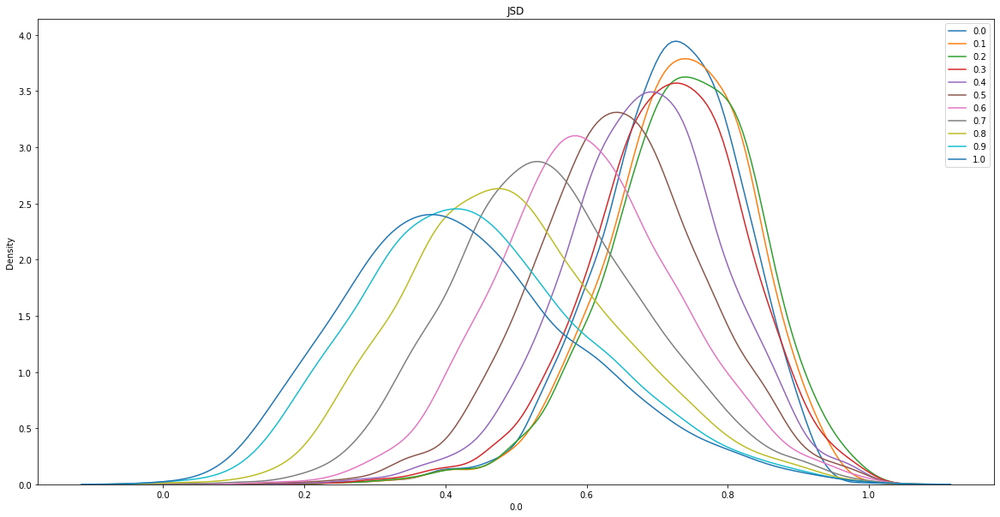

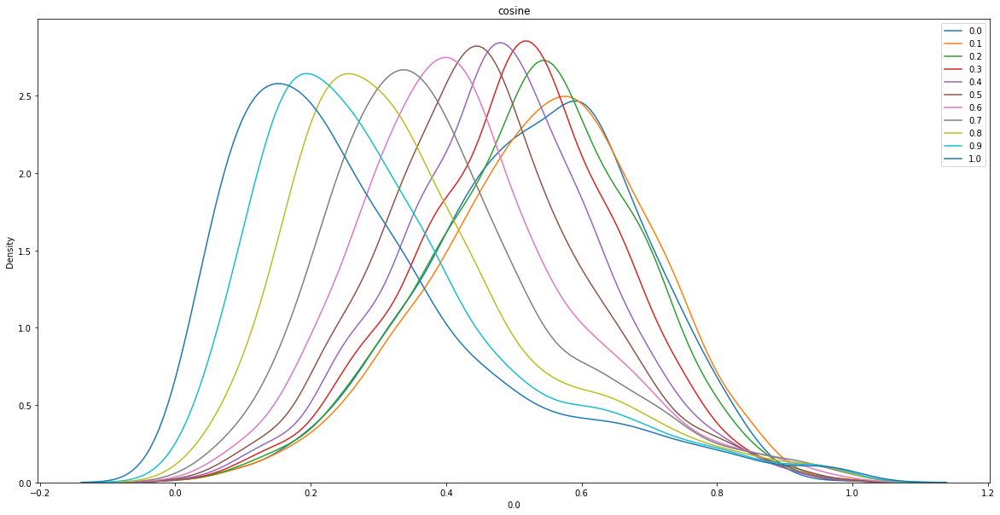

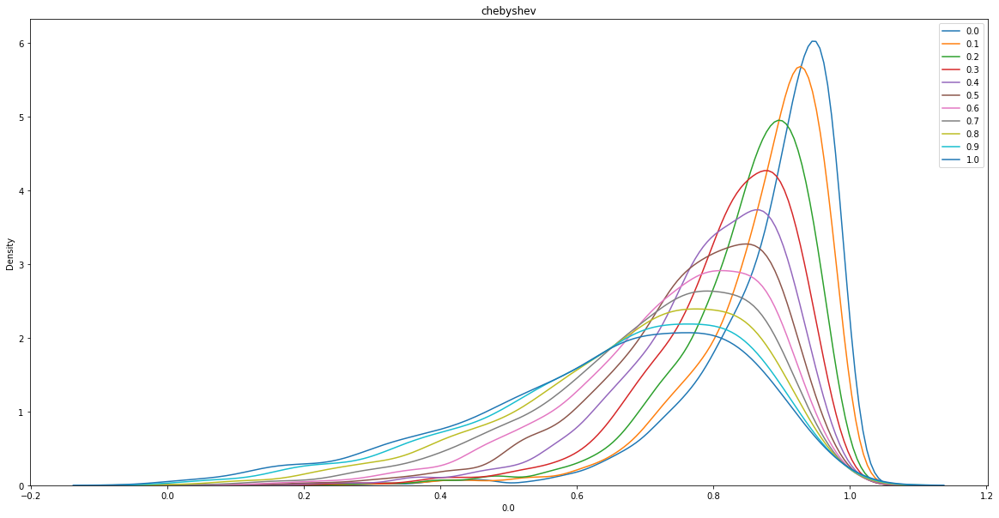

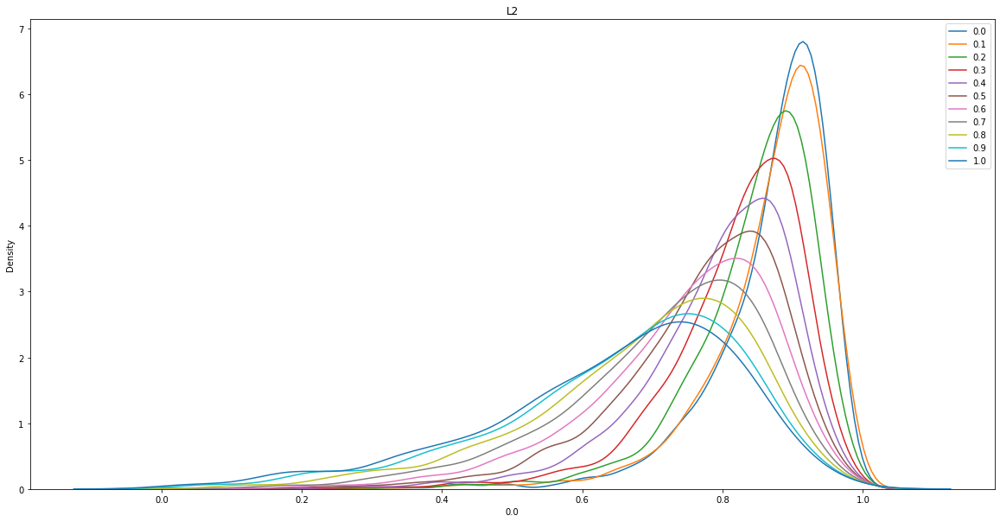

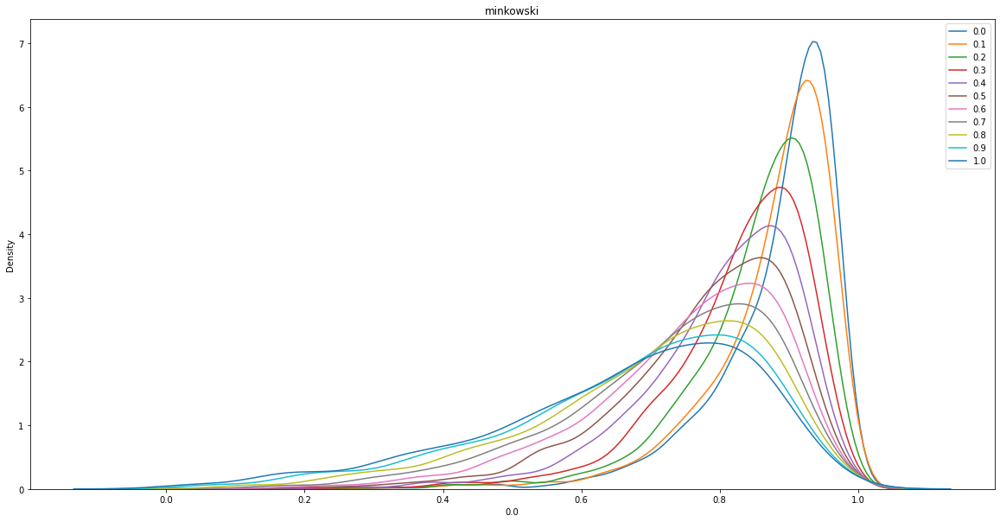

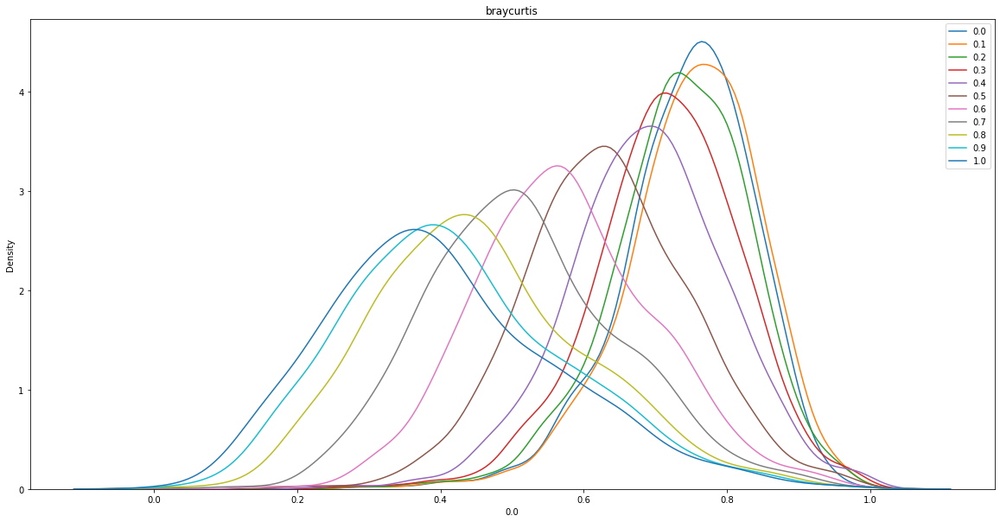

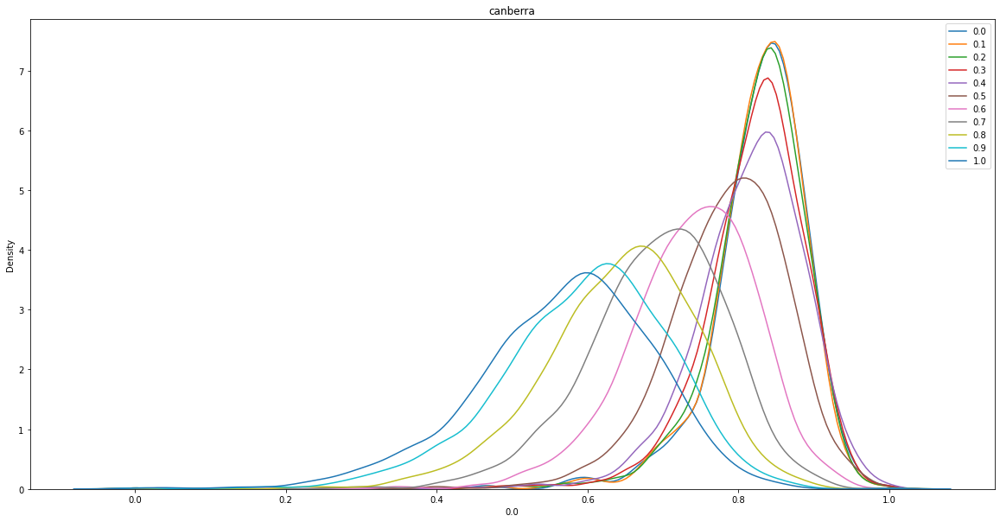

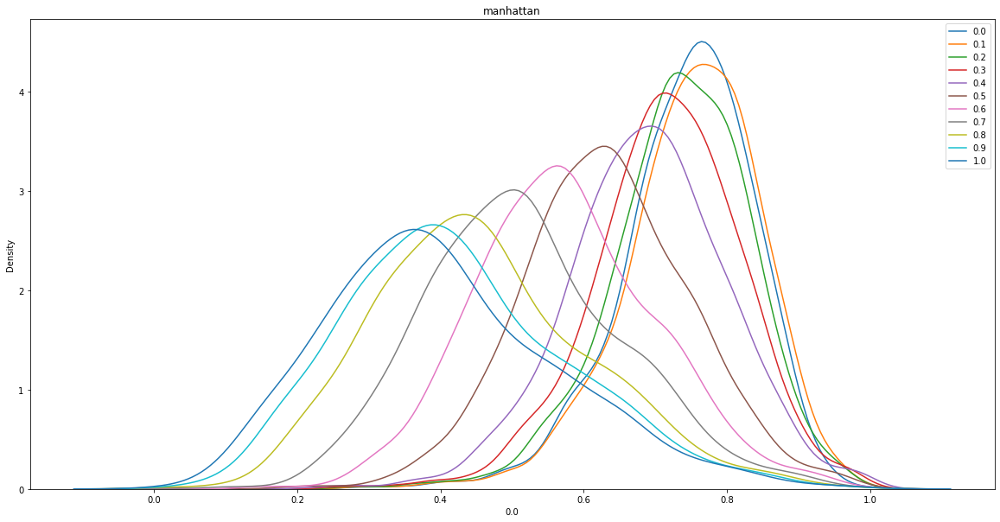

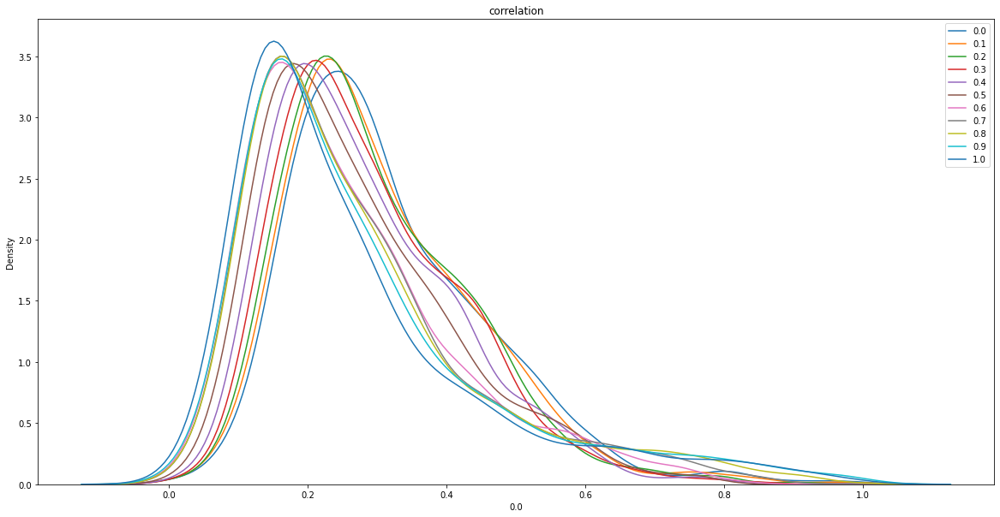

In [12]:
similarity.similarity_distribution(0, measures)

### Measure Normalisation

In [13]:
ms = {measure : [] for measure in measures}
for measure in measures:
    ms1 = similarity.most_similar_sorted(0, measure, 0.5)
    ms1 = np.array([m[1] for m in ms1])
    ms[measure] += list(ms1)

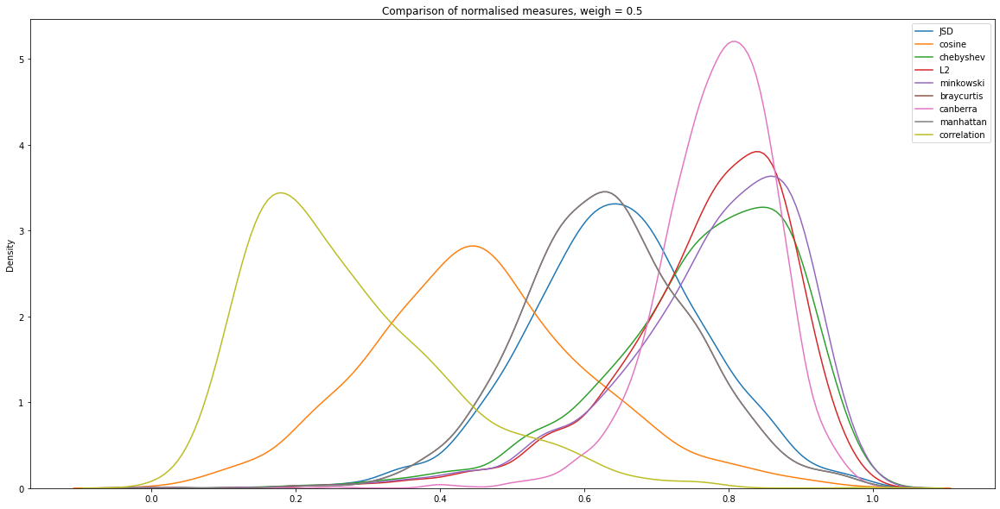

In [14]:
fig = plt.figure(1, figsize=(20, 10))
for measure in measures:
    sns.kdeplot(ms[measure], label=measure)
plt.legend() 
plt.title('Comparison of normalised measures, weigh = 0.5')
plt.show()

    We can make 5 groups
    We verify that we have superposition between Manhattan and Braycurtis curve, because they are the same on normalized data
    We will keep Manhattan

In [10]:
measures.remove('braycurtis')

### Shapiro test to see if the distribution is normal

In [16]:
for measure in measures:
    shapiro_test = stats.shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print(measure, shapiro_test)

JSD ShapiroResult(statistic=0.9957364201545715, pvalue=0.0002018342784140259)
cosine ShapiroResult(statistic=0.9941739439964294, pvalue=7.631038897670805e-06)
chebyshev ShapiroResult(statistic=0.9339924454689026, pvalue=7.734368256311944e-26)
L2 ShapiroResult(statistic=0.9194713830947876, pvalue=3.4656336569858124e-28)
minkowski ShapiroResult(statistic=0.9183048009872437, pvalue=2.3211396764014894e-28)
canberra ShapiroResult(statistic=0.9417777061462402, pvalue=2.065783938830248e-24)
manhattan ShapiroResult(statistic=0.9955908060073853, pvalue=0.0001459739578422159)
correlation ShapiroResult(statistic=0.9357225298881531, pvalue=1.5629513760678917e-25)


In [17]:
# generate univariate observations
# normality test
for measure in measures:
    stat, p = shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.994, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.934, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.919, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.918, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.942, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.936, p=0.000
Sample does not look Gaussian (reject H0)


/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


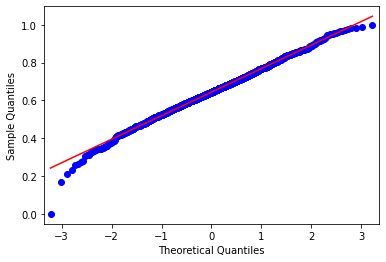

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


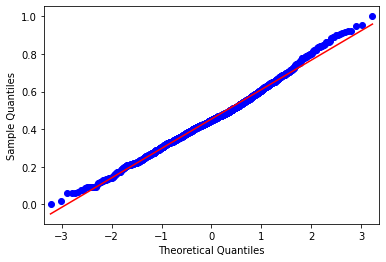

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


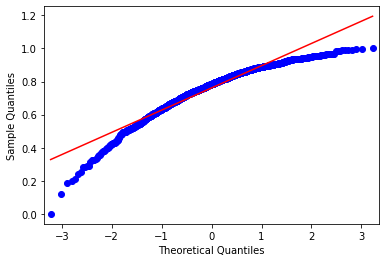

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


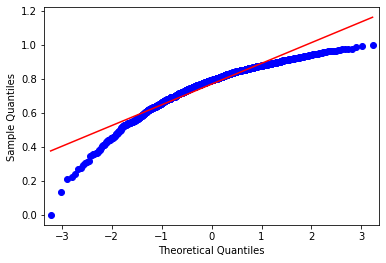

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


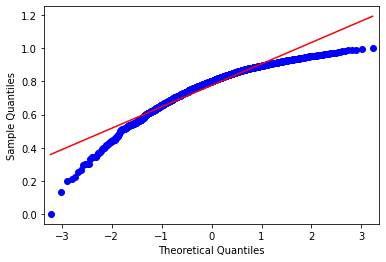

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


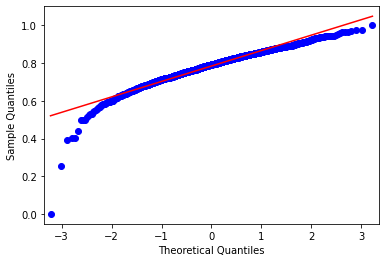

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


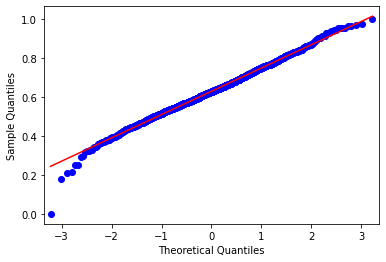

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


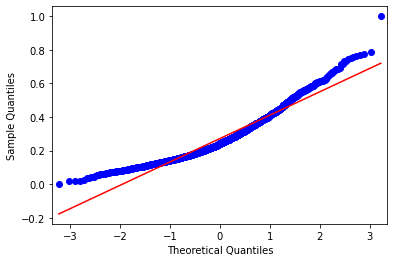

In [18]:
for measure in measures:
    qqplot(np.array(ms[measure]), line='s')
    pyplot.show()

In [19]:
weights ={measure : 0.5 for measure in measures}

In [20]:
matrix_prediction = similarity.same_prediction(weights)

step 1/431 : 0.7295165061950684sec
step 2/431 : 0.728355884552002sec
step 3/431 : 0.7342321872711182sec
step 4/431 : 0.7288463115692139sec
step 5/431 : 0.736351728439331sec
step 6/431 : 0.7350454330444336sec
step 7/431 : 0.7341132164001465sec
step 8/431 : 0.7382192611694336sec
step 9/431 : 0.7346456050872803sec
step 10/431 : 0.7310454845428467sec
step 11/431 : 0.7292649745941162sec
step 12/431 : 0.7359998226165771sec
step 13/431 : 0.7265274524688721sec
step 14/431 : 0.7290267944335938sec
step 15/431 : 0.7275004386901855sec
step 16/431 : 0.7260434627532959sec
step 17/431 : 0.7294058799743652sec
step 18/431 : 0.7398231029510498sec
step 19/431 : 0.7424600124359131sec
step 20/431 : 0.7254424095153809sec
step 21/431 : 0.7256371974945068sec
step 22/431 : 0.725872278213501sec
step 23/431 : 0.7248210906982422sec
step 24/431 : 0.7260098457336426sec
step 25/431 : 0.736501932144165sec
step 26/431 : 0.7400789260864258sec
step 27/431 : 0.7305800914764404sec
step 28/431 : 0.7258176803588867sec
step 

step 227/431 : 0.7764079570770264sec
step 228/431 : 0.7315592765808105sec
step 229/431 : 0.738274097442627sec
step 230/431 : 0.7343621253967285sec
step 231/431 : 0.777789831161499sec
step 232/431 : 0.7308499813079834sec
step 233/431 : 0.731391191482544sec
step 234/431 : 0.7354609966278076sec
step 235/431 : 0.7357199192047119sec
step 236/431 : 0.7413489818572998sec
step 237/431 : 0.7358417510986328sec
step 238/431 : 0.7365868091583252sec
step 239/431 : 0.7322168350219727sec
step 240/431 : 0.7549493312835693sec
step 241/431 : 0.7350902557373047sec
step 242/431 : 0.7563681602478027sec
step 243/431 : 0.7261786460876465sec
step 244/431 : 0.7311177253723145sec
step 245/431 : 0.8005988597869873sec
step 246/431 : 0.8244898319244385sec
step 247/431 : 0.824591875076294sec
step 248/431 : 0.7990438938140869sec
step 249/431 : 0.7220919132232666sec
step 250/431 : 0.7313735485076904sec
step 251/431 : 0.7257654666900635sec
step 252/431 : 0.7360000610351562sec
step 253/431 : 0.725862979888916sec
step 2

In [21]:
matrix_prediction

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,0,92153110,216326814,181660734,203630174,223326410,52645444,212310450
cosine,92153110,0,197986180,175241300,190892260,265544138,124622036,205708988
chebyshev,216326814,197986180,0,73743236,47533362,331134004,234755686,331735074
L2,181660734,175241300,73743236,0,32299048,320621638,199373692,312020798
minkowski,203630174,190892260,47533362,32299048,0,330069746,221952006,325639506
canberra,223326410,265544138,331134004,320621638,330069746,0,203344196,272812630
manhattan,52645444,124622036,234755686,199373692,221952006,203344196,0,216342174
correlation,212310450,205708988,331735074,312020798,325639506,272812630,216342174,0


In [22]:
(1-matrix_prediction/matrix_prediction.max().max()).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1.000000,0.722209,0.347893,0.452392,0.386166,0.326793,0.841303,0.360000
cosine,0.722209,1.000000,0.403180,0.471743,0.424564,0.199530,0.624333,0.379900
chebyshev,0.347893,0.403180,1.000000,0.777704,0.856713,0.001812,0.292340,0.000000
L2,0.452392,0.471743,0.777704,1.000000,0.902636,0.033501,0.398997,0.059428
minkowski,0.386166,0.424564,0.856713,0.902636,1.000000,0.005020,0.330936,0.018375
canberra,0.326793,0.199530,0.001812,0.033501,0.005020,1.000000,0.387028,0.177619
manhattan,0.841303,0.624333,0.292340,0.398997,0.330936,0.387028,1.000000,0.347847
correlation,0.360000,0.379900,0.000000,0.059428,0.018375,0.177619,0.347847,1.000000


In [23]:
(1-matrix_prediction).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1,-92153109,-216326813,-181660733,-203630173,-223326409,-52645443,-212310449
cosine,-92153109,1,-197986179,-175241299,-190892259,-265544137,-124622035,-205708987
chebyshev,-216326813,-197986179,1,-73743235,-47533361,-331134003,-234755685,-331735073
L2,-181660733,-175241299,-73743235,1,-32299047,-320621637,-199373691,-312020797
minkowski,-203630173,-190892259,-47533361,-32299047,1,-330069745,-221952005,-325639505
canberra,-223326409,-265544137,-331134003,-320621637,-330069745,1,-203344195,-272812629
manhattan,-52645443,-124622035,-234755685,-199373691,-221952005,-203344195,1,-216342173
correlation,-212310449,-205708987,-331735073,-312020797,-325639505,-272812629,-216342173,1


### Evaluation of performance

In [10]:
field, tag = similarity.evaluation(data_eval, measures)

JSD
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
cosine
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
chebyshev
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
L2
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
minkowski
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
braycurtis
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
canberra
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
manhattan
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
correlation
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [11]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field.values(), tag.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
math,0.840708,0.159292,0.000000
computer,0.436170,0.563830,0.000000
physic,0.408333,0.591667,0.000000
biologie,0.461538,0.538462,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.389381,0.610619,0.000000
computer,0.180851,0.819149,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.317308,0.682692,0.000000


,Well classified field,Badly classified field,Weight
math,0.938053,0.061947,0.100000
computer,0.585106,0.414894,0.100000
physic,0.916667,0.083333,0.100000
biologie,0.701923,0.298077,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.100000
computer,0.276596,0.723404,0.100000
physic,0.366667,0.633333,0.100000
biologie,0.471154,0.528846,0.100000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.200000
computer,0.659574,0.340426,0.200000
physic,0.925000,0.075000,0.200000
biologie,0.769231,0.230769,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,0.200000
computer,0.329787,0.670213,0.200000
physic,0.375000,0.625000,0.200000
biologie,0.538462,0.461538,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.680851,0.319149,0.300000
physic,0.958333,0.041667,0.300000
biologie,0.807692,0.192308,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.681416,0.318584,0.300000
computer,0.361702,0.638298,0.300000
physic,0.400000,0.600000,0.300000
biologie,0.576923,0.423077,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.787234,0.212766,0.400000
physic,0.958333,0.041667,0.400000
biologie,0.865385,0.134615,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.400000
computer,0.414894,0.585106,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.634615,0.365385,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.829787,0.170213,0.500000
physic,0.950000,0.050000,0.500000
biologie,0.894231,0.105769,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.500000
computer,0.457447,0.542553,0.500000
physic,0.416667,0.583333,0.500000
biologie,0.692308,0.307692,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.840426,0.159574,0.600000
physic,0.958333,0.041667,0.600000
biologie,0.884615,0.115385,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.752212,0.247788,0.600000
computer,0.489362,0.510638,0.600000
physic,0.458333,0.541667,0.600000
biologie,0.692308,0.307692,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.851064,0.148936,0.700000
physic,0.966667,0.033333,0.700000
biologie,0.865385,0.134615,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.743363,0.256637,0.700000
computer,0.489362,0.510638,0.700000
physic,0.483333,0.516667,0.700000
biologie,0.692308,0.307692,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.840426,0.159574,0.800000
physic,0.958333,0.041667,0.800000
biologie,0.884615,0.115385,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.800000
computer,0.478723,0.521277,0.800000
physic,0.491667,0.508333,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.840426,0.159574,0.900000
physic,0.958333,0.041667,0.900000
biologie,0.894231,0.105769,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.489362,0.510638,0.900000
physic,0.500000,0.500000,0.900000
biologie,0.740385,0.259615,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.840426,0.159574,1.000000
physic,0.958333,0.041667,1.000000
biologie,0.894231,0.105769,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.725664,0.274336,1.000000
computer,0.500000,0.500000,1.000000
physic,0.475000,0.525000,1.000000
biologie,0.711538,0.288462,1.000000


cosine


,Well classified field,Badly classified field,Weight
math,0.840708,0.159292,0.000000
computer,0.510638,0.489362,0.000000
physic,0.483333,0.516667,0.000000
biologie,0.519231,0.480769,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.424779,0.575221,0.000000
computer,0.255319,0.744681,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.365385,0.634615,0.000000


,Well classified field,Badly classified field,Weight
math,0.973451,0.026549,0.100000
computer,0.648936,0.351064,0.100000
physic,0.900000,0.100000,0.100000
biologie,0.740385,0.259615,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.451327,0.548673,0.100000
computer,0.340426,0.659574,0.100000
physic,0.300000,0.700000,0.100000
biologie,0.500000,0.500000,0.100000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.200000
computer,0.702128,0.297872,0.200000
physic,0.916667,0.083333,0.200000
biologie,0.788462,0.211538,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.486726,0.513274,0.200000
computer,0.372340,0.627660,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.567308,0.432692,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.797872,0.202128,0.300000
physic,0.933333,0.066667,0.300000
biologie,0.826923,0.173077,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.495575,0.504425,0.300000
computer,0.404255,0.595745,0.300000
physic,0.383333,0.616667,0.300000
biologie,0.586538,0.413462,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.840426,0.159574,0.400000
physic,0.908333,0.091667,0.400000
biologie,0.836538,0.163462,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.400000
computer,0.436170,0.563830,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.653846,0.346154,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.829787,0.170213,0.500000
physic,0.908333,0.091667,0.500000
biologie,0.836538,0.163462,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.500000
computer,0.446809,0.553191,0.500000
physic,0.400000,0.600000,0.500000
biologie,0.701923,0.298077,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.819149,0.180851,0.600000
physic,0.900000,0.100000,0.600000
biologie,0.855769,0.144231,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.600000
computer,0.457447,0.542553,0.600000
physic,0.358333,0.641667,0.600000
biologie,0.711538,0.288462,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.829787,0.170213,0.700000
physic,0.883333,0.116667,0.700000
biologie,0.875000,0.125000,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.700000
computer,0.446809,0.553191,0.700000
physic,0.341667,0.658333,0.700000
biologie,0.701923,0.298077,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.819149,0.180851,0.800000
physic,0.883333,0.116667,0.800000
biologie,0.855769,0.144231,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.800000
computer,0.404255,0.595745,0.800000
physic,0.383333,0.616667,0.800000
biologie,0.673077,0.326923,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.829787,0.170213,0.900000
physic,0.900000,0.100000,0.900000
biologie,0.865385,0.134615,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.900000
computer,0.414894,0.585106,0.900000
physic,0.366667,0.633333,0.900000
biologie,0.682692,0.317308,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.840426,0.159574,1.000000
physic,0.908333,0.091667,1.000000
biologie,0.865385,0.134615,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,1.000000
computer,0.404255,0.595745,1.000000
physic,0.350000,0.650000,1.000000
biologie,0.721154,0.278846,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
math,0.734513,0.265487,0.000000
computer,0.457447,0.542553,0.000000
physic,0.558333,0.441667,0.000000
biologie,0.403846,0.596154,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.398230,0.601770,0.000000
computer,0.212766,0.787234,0.000000
physic,0.091667,0.908333,0.000000
biologie,0.240385,0.759615,0.000000


,Well classified field,Badly classified field,Weight
math,0.973451,0.026549,0.100000
computer,0.648936,0.351064,0.100000
physic,0.891667,0.108333,0.100000
biologie,0.567308,0.432692,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.100000
computer,0.319149,0.680851,0.100000
physic,0.266667,0.733333,0.100000
biologie,0.375000,0.625000,0.100000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.200000
computer,0.734043,0.265957,0.200000
physic,0.883333,0.116667,0.200000
biologie,0.673077,0.326923,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.200000
computer,0.351064,0.648936,0.200000
physic,0.308333,0.691667,0.200000
biologie,0.461538,0.538462,0.200000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.300000
computer,0.755319,0.244681,0.300000
physic,0.883333,0.116667,0.300000
biologie,0.701923,0.298077,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.300000
computer,0.361702,0.638298,0.300000
physic,0.325000,0.675000,0.300000
biologie,0.548077,0.451923,0.300000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.400000
computer,0.755319,0.244681,0.400000
physic,0.866667,0.133333,0.400000
biologie,0.750000,0.250000,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.400000
computer,0.361702,0.638298,0.400000
physic,0.341667,0.658333,0.400000
biologie,0.586538,0.413462,0.400000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.500000
computer,0.797872,0.202128,0.500000
physic,0.858333,0.141667,0.500000
biologie,0.788462,0.211538,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.500000
computer,0.414894,0.585106,0.500000
physic,0.333333,0.666667,0.500000
biologie,0.615385,0.384615,0.500000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.600000
computer,0.787234,0.212766,0.600000
physic,0.883333,0.116667,0.600000
biologie,0.807692,0.192308,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.600000
computer,0.393617,0.606383,0.600000
physic,0.358333,0.641667,0.600000
biologie,0.625000,0.375000,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
computer,0.787234,0.212766,0.700000
physic,0.891667,0.108333,0.700000
biologie,0.798077,0.201923,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.700000
computer,0.404255,0.595745,0.700000
physic,0.366667,0.633333,0.700000
biologie,0.625000,0.375000,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
computer,0.808511,0.191489,0.800000
physic,0.891667,0.108333,0.800000
biologie,0.817308,0.182692,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.800000
computer,0.404255,0.595745,0.800000
physic,0.366667,0.633333,0.800000
biologie,0.663462,0.336538,0.800000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.900000
computer,0.808511,0.191489,0.900000
physic,0.891667,0.108333,0.900000
biologie,0.817308,0.182692,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.900000
computer,0.414894,0.585106,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.625000,0.375000,0.900000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,1.000000
computer,0.787234,0.212766,1.000000
physic,0.891667,0.108333,1.000000
biologie,0.798077,0.201923,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,1.000000
computer,0.393617,0.606383,1.000000
physic,0.341667,0.658333,1.000000
biologie,0.615385,0.384615,1.000000


L2


,Well classified field,Badly classified field,Weight
math,0.831858,0.168142,0.000000
computer,0.446809,0.553191,0.000000
physic,0.433333,0.566667,0.000000
biologie,0.519231,0.480769,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.380531,0.619469,0.000000
computer,0.234043,0.765957,0.000000
physic,0.108333,0.891667,0.000000
biologie,0.317308,0.682692,0.000000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.100000
computer,0.691489,0.308511,0.100000
physic,0.908333,0.091667,0.100000
biologie,0.778846,0.221154,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.100000
computer,0.340426,0.659574,0.100000
physic,0.358333,0.641667,0.100000
biologie,0.548077,0.451923,0.100000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.200000
computer,0.734043,0.265957,0.200000
physic,0.933333,0.066667,0.200000
biologie,0.788462,0.211538,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.200000
computer,0.340426,0.659574,0.200000
physic,0.366667,0.633333,0.200000
biologie,0.567308,0.432692,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.755319,0.244681,0.300000
physic,0.950000,0.050000,0.300000
biologie,0.846154,0.153846,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.300000
computer,0.351064,0.648936,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.400000
computer,0.765957,0.234043,0.400000
physic,0.908333,0.091667,0.400000
biologie,0.855769,0.144231,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.400000
computer,0.340426,0.659574,0.400000
physic,0.358333,0.641667,0.400000
biologie,0.644231,0.355769,0.400000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.500000
computer,0.776596,0.223404,0.500000
physic,0.908333,0.091667,0.500000
biologie,0.875000,0.125000,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.500000
computer,0.361702,0.638298,0.500000
physic,0.350000,0.650000,0.500000
biologie,0.644231,0.355769,0.500000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.600000
computer,0.787234,0.212766,0.600000
physic,0.908333,0.091667,0.600000
biologie,0.884615,0.115385,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.600000
computer,0.382979,0.617021,0.600000
physic,0.383333,0.616667,0.600000
biologie,0.634615,0.365385,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
computer,0.797872,0.202128,0.700000
physic,0.900000,0.100000,0.700000
biologie,0.884615,0.115385,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.700000
computer,0.393617,0.606383,0.700000
physic,0.366667,0.633333,0.700000
biologie,0.644231,0.355769,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
computer,0.797872,0.202128,0.800000
physic,0.900000,0.100000,0.800000
biologie,0.884615,0.115385,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.800000
computer,0.382979,0.617021,0.800000
physic,0.350000,0.650000,0.800000
biologie,0.663462,0.336538,0.800000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.900000
computer,0.797872,0.202128,0.900000
physic,0.908333,0.091667,0.900000
biologie,0.865385,0.134615,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,0.900000
computer,0.393617,0.606383,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.644231,0.355769,0.900000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,1.000000
computer,0.808511,0.191489,1.000000
physic,0.900000,0.100000,1.000000
biologie,0.865385,0.134615,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,1.000000
computer,0.393617,0.606383,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.653846,0.346154,1.000000


minkowski


,Well classified field,Badly classified field,Weight
math,0.796460,0.203540,0.000000
computer,0.446809,0.553191,0.000000
physic,0.541667,0.458333,0.000000
biologie,0.471154,0.528846,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.371681,0.628319,0.000000
computer,0.244681,0.755319,0.000000
physic,0.100000,0.900000,0.000000
biologie,0.298077,0.701923,0.000000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.100000
computer,0.670213,0.329787,0.100000
physic,0.908333,0.091667,0.100000
biologie,0.711538,0.288462,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.100000
computer,0.351064,0.648936,0.100000
physic,0.308333,0.691667,0.100000
biologie,0.423077,0.576923,0.100000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.200000
computer,0.744681,0.255319,0.200000
physic,0.925000,0.075000,0.200000
biologie,0.807692,0.192308,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.200000
computer,0.329787,0.670213,0.200000
physic,0.350000,0.650000,0.200000
biologie,0.548077,0.451923,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.797872,0.202128,0.300000
physic,0.925000,0.075000,0.300000
biologie,0.826923,0.173077,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.300000
computer,0.404255,0.595745,0.300000
physic,0.383333,0.616667,0.300000
biologie,0.596154,0.403846,0.300000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.400000
computer,0.808511,0.191489,0.400000
physic,0.908333,0.091667,0.400000
biologie,0.875000,0.125000,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.400000
computer,0.404255,0.595745,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.634615,0.365385,0.400000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.500000
computer,0.829787,0.170213,0.500000
physic,0.900000,0.100000,0.500000
biologie,0.894231,0.105769,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.500000
computer,0.436170,0.563830,0.500000
physic,0.358333,0.641667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.600000
computer,0.829787,0.170213,0.600000
physic,0.900000,0.100000,0.600000
biologie,0.894231,0.105769,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.600000
computer,0.468085,0.531915,0.600000
physic,0.350000,0.650000,0.600000
biologie,0.653846,0.346154,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
computer,0.819149,0.180851,0.700000
physic,0.900000,0.100000,0.700000
biologie,0.884615,0.115385,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.700000
computer,0.446809,0.553191,0.700000
physic,0.358333,0.641667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
computer,0.819149,0.180851,0.800000
physic,0.900000,0.100000,0.800000
biologie,0.865385,0.134615,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.800000
computer,0.436170,0.563830,0.800000
physic,0.358333,0.641667,0.800000
biologie,0.673077,0.326923,0.800000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.900000
computer,0.797872,0.202128,0.900000
physic,0.900000,0.100000,0.900000
biologie,0.855769,0.144231,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.900000
computer,0.414894,0.585106,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.682692,0.317308,0.900000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,1.000000
computer,0.797872,0.202128,1.000000
physic,0.891667,0.108333,1.000000
biologie,0.836538,0.163462,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,1.000000
computer,0.404255,0.595745,1.000000
physic,0.358333,0.641667,1.000000
biologie,0.653846,0.346154,1.000000


braycurtis


,Well classified field,Badly classified field,Weight
math,0.946903,0.053097,0.000000
computer,0.446809,0.553191,0.000000
physic,0.541667,0.458333,0.000000
biologie,0.480769,0.519231,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.460177,0.539823,0.000000
computer,0.223404,0.776596,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.326923,0.673077,0.000000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.100000
computer,0.595745,0.404255,0.100000
physic,0.883333,0.116667,0.100000
biologie,0.682692,0.317308,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.100000
computer,0.340426,0.659574,0.100000
physic,0.316667,0.683333,0.100000
biologie,0.480769,0.519231,0.100000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.200000
computer,0.670213,0.329787,0.200000
physic,0.916667,0.083333,0.200000
biologie,0.817308,0.182692,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.672566,0.327434,0.200000
computer,0.329787,0.670213,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.755319,0.244681,0.300000
physic,0.933333,0.066667,0.300000
biologie,0.865385,0.134615,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.300000
computer,0.404255,0.595745,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.808511,0.191489,0.400000
physic,0.933333,0.066667,0.400000
biologie,0.884615,0.115385,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.400000
computer,0.414894,0.585106,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.615385,0.384615,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.840426,0.159574,0.500000
physic,0.950000,0.050000,0.500000
biologie,0.884615,0.115385,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.500000
computer,0.468085,0.531915,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.851064,0.148936,0.600000
physic,0.950000,0.050000,0.600000
biologie,0.894231,0.105769,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.600000
computer,0.457447,0.542553,0.600000
physic,0.433333,0.566667,0.600000
biologie,0.663462,0.336538,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.861702,0.138298,0.700000
physic,0.950000,0.050000,0.700000
biologie,0.903846,0.096154,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.700000
computer,0.425532,0.574468,0.700000
physic,0.433333,0.566667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.851064,0.148936,0.800000
physic,0.950000,0.050000,0.800000
biologie,0.894231,0.105769,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.800000
computer,0.414894,0.585106,0.800000
physic,0.466667,0.533333,0.800000
biologie,0.692308,0.307692,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.851064,0.148936,0.900000
physic,0.941667,0.058333,0.900000
biologie,0.894231,0.105769,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.446809,0.553191,0.900000
physic,0.475000,0.525000,0.900000
biologie,0.711538,0.288462,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.840426,0.159574,1.000000
physic,0.941667,0.058333,1.000000
biologie,0.894231,0.105769,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
physic,0.441667,0.558333,1.000000
biologie,0.711538,0.288462,1.000000


canberra


,Well classified field,Badly classified field,Weight
math,0.973451,0.026549,0.000000
computer,0.446809,0.553191,0.000000
physic,0.516667,0.483333,0.000000
biologie,0.365385,0.634615,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.000000
computer,0.159574,0.840426,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.259615,0.740385,0.000000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.100000
computer,0.457447,0.542553,0.100000
physic,0.625000,0.375000,0.100000
biologie,0.480769,0.519231,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.100000
computer,0.180851,0.819149,0.100000
physic,0.191667,0.808333,0.100000
biologie,0.326923,0.673077,0.100000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.200000
computer,0.542553,0.457447,0.200000
physic,0.725000,0.275000,0.200000
biologie,0.548077,0.451923,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.200000
computer,0.234043,0.765957,0.200000
physic,0.283333,0.716667,0.200000
biologie,0.394231,0.605769,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.553191,0.446809,0.300000
physic,0.791667,0.208333,0.300000
biologie,0.576923,0.423077,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.300000
computer,0.255319,0.744681,0.300000
physic,0.375000,0.625000,0.300000
biologie,0.413462,0.586538,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.627660,0.372340,0.400000
physic,0.816667,0.183333,0.400000
biologie,0.557692,0.442308,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.400000
computer,0.297872,0.702128,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.365385,0.634615,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.606383,0.393617,0.500000
physic,0.833333,0.166667,0.500000
biologie,0.596154,0.403846,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.500000
computer,0.340426,0.659574,0.500000
physic,0.400000,0.600000,0.500000
biologie,0.384615,0.615385,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.606383,0.393617,0.600000
physic,0.858333,0.141667,0.600000
biologie,0.605769,0.394231,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.600000
computer,0.308511,0.691489,0.600000
physic,0.416667,0.583333,0.600000
biologie,0.413462,0.586538,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.606383,0.393617,0.700000
physic,0.858333,0.141667,0.700000
biologie,0.596154,0.403846,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.700000
computer,0.329787,0.670213,0.700000
physic,0.408333,0.591667,0.700000
biologie,0.403846,0.596154,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.595745,0.404255,0.800000
physic,0.858333,0.141667,0.800000
biologie,0.605769,0.394231,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.800000
computer,0.319149,0.680851,0.800000
physic,0.425000,0.575000,0.800000
biologie,0.403846,0.596154,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.574468,0.425532,0.900000
physic,0.850000,0.150000,0.900000
biologie,0.644231,0.355769,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.900000
computer,0.308511,0.691489,0.900000
physic,0.400000,0.600000,0.900000
biologie,0.461538,0.538462,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.563830,0.436170,1.000000
physic,0.858333,0.141667,1.000000
biologie,0.663462,0.336538,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,1.000000
computer,0.329787,0.670213,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.471154,0.528846,1.000000


manhattan


,Well classified field,Badly classified field,Weight
math,0.946903,0.053097,0.000000
computer,0.446809,0.553191,0.000000
physic,0.541667,0.458333,0.000000
biologie,0.480769,0.519231,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.460177,0.539823,0.000000
computer,0.223404,0.776596,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.326923,0.673077,0.000000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.100000
computer,0.595745,0.404255,0.100000
physic,0.883333,0.116667,0.100000
biologie,0.682692,0.317308,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.100000
computer,0.340426,0.659574,0.100000
physic,0.316667,0.683333,0.100000
biologie,0.480769,0.519231,0.100000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.200000
computer,0.670213,0.329787,0.200000
physic,0.916667,0.083333,0.200000
biologie,0.817308,0.182692,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.672566,0.327434,0.200000
computer,0.329787,0.670213,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
computer,0.755319,0.244681,0.300000
physic,0.933333,0.066667,0.300000
biologie,0.865385,0.134615,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.300000
computer,0.404255,0.595745,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.808511,0.191489,0.400000
physic,0.933333,0.066667,0.400000
biologie,0.884615,0.115385,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.400000
computer,0.414894,0.585106,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.615385,0.384615,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.840426,0.159574,0.500000
physic,0.950000,0.050000,0.500000
biologie,0.884615,0.115385,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.500000
computer,0.468085,0.531915,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.851064,0.148936,0.600000
physic,0.950000,0.050000,0.600000
biologie,0.894231,0.105769,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.600000
computer,0.457447,0.542553,0.600000
physic,0.433333,0.566667,0.600000
biologie,0.663462,0.336538,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.861702,0.138298,0.700000
physic,0.950000,0.050000,0.700000
biologie,0.903846,0.096154,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.700000
computer,0.425532,0.574468,0.700000
physic,0.433333,0.566667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.851064,0.148936,0.800000
physic,0.950000,0.050000,0.800000
biologie,0.894231,0.105769,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.800000
computer,0.414894,0.585106,0.800000
physic,0.466667,0.533333,0.800000
biologie,0.692308,0.307692,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.851064,0.148936,0.900000
physic,0.941667,0.058333,0.900000
biologie,0.894231,0.105769,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.446809,0.553191,0.900000
physic,0.475000,0.525000,0.900000
biologie,0.711538,0.288462,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.840426,0.159574,1.000000
physic,0.941667,0.058333,1.000000
biologie,0.894231,0.105769,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
physic,0.441667,0.558333,1.000000
biologie,0.711538,0.288462,1.000000


correlation


,Well classified field,Badly classified field,Weight
math,0.867257,0.132743,0.000000
computer,0.638298,0.361702,0.000000
physic,0.541667,0.458333,0.000000
biologie,0.625000,0.375000,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.495575,0.504425,0.000000
computer,0.361702,0.638298,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.500000,0.500000,0.000000


,Well classified field,Badly classified field,Weight
math,0.938053,0.061947,0.100000
computer,0.691489,0.308511,0.100000
physic,0.675000,0.325000,0.100000
biologie,0.663462,0.336538,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.100000
computer,0.372340,0.627660,0.100000
physic,0.183333,0.816667,0.100000
biologie,0.548077,0.451923,0.100000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.200000
computer,0.702128,0.297872,0.200000
physic,0.775000,0.225000,0.200000
biologie,0.682692,0.317308,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.200000
computer,0.382979,0.617021,0.200000
physic,0.216667,0.783333,0.200000
biologie,0.557692,0.442308,0.200000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.300000
computer,0.734043,0.265957,0.300000
physic,0.841667,0.158333,0.300000
biologie,0.721154,0.278846,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.300000
computer,0.414894,0.585106,0.300000
physic,0.283333,0.716667,0.300000
biologie,0.586538,0.413462,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
computer,0.808511,0.191489,0.400000
physic,0.891667,0.108333,0.400000
biologie,0.798077,0.201923,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.400000
computer,0.425532,0.574468,0.400000
physic,0.316667,0.683333,0.400000
biologie,0.653846,0.346154,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
computer,0.861702,0.138298,0.500000
physic,0.850000,0.150000,0.500000
biologie,0.798077,0.201923,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.500000
computer,0.468085,0.531915,0.500000
physic,0.300000,0.700000,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
computer,0.840426,0.159574,0.600000
physic,0.850000,0.150000,0.600000
biologie,0.855769,0.144231,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.600000
computer,0.468085,0.531915,0.600000
physic,0.300000,0.700000,0.600000
biologie,0.721154,0.278846,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
computer,0.861702,0.138298,0.700000
physic,0.866667,0.133333,0.700000
biologie,0.855769,0.144231,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.700000
computer,0.457447,0.542553,0.700000
physic,0.300000,0.700000,0.700000
biologie,0.740385,0.259615,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
computer,0.840426,0.159574,0.800000
physic,0.875000,0.125000,0.800000
biologie,0.875000,0.125000,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.800000
computer,0.468085,0.531915,0.800000
physic,0.300000,0.700000,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
computer,0.840426,0.159574,0.900000
physic,0.883333,0.116667,0.900000
biologie,0.865385,0.134615,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.681416,0.318584,0.900000
computer,0.404255,0.595745,0.900000
physic,0.333333,0.666667,0.900000
biologie,0.701923,0.298077,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
computer,0.819149,0.180851,1.000000
physic,0.900000,0.100000,1.000000
biologie,0.855769,0.144231,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,1.000000
computer,0.404255,0.595745,1.000000
physic,0.341667,0.658333,1.000000
biologie,0.701923,0.298077,1.000000


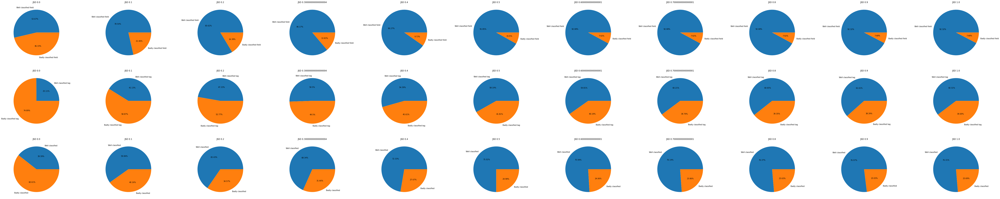

************************************************************************************************************************


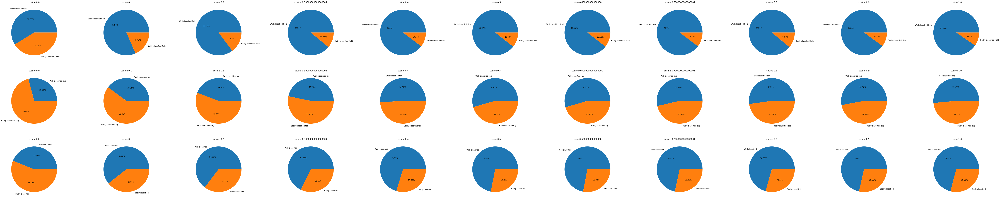

************************************************************************************************************************


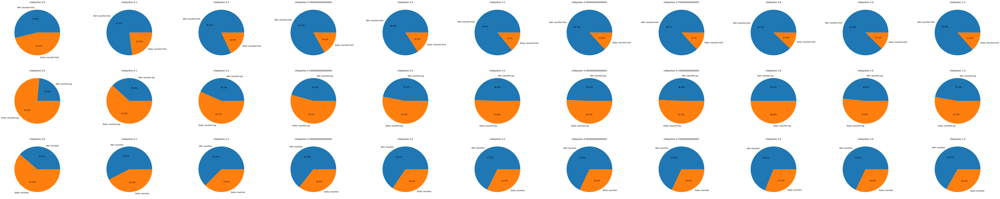

************************************************************************************************************************


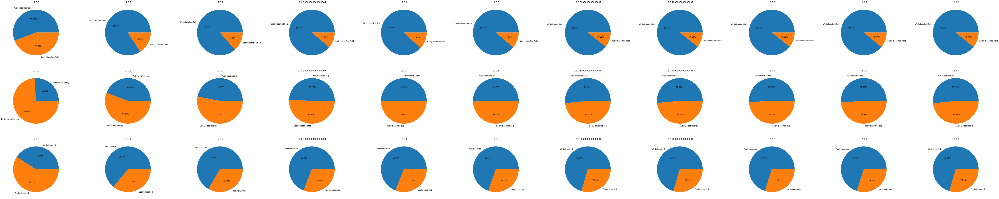

************************************************************************************************************************


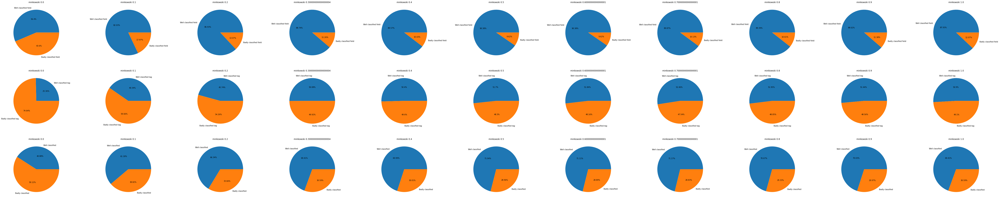

************************************************************************************************************************


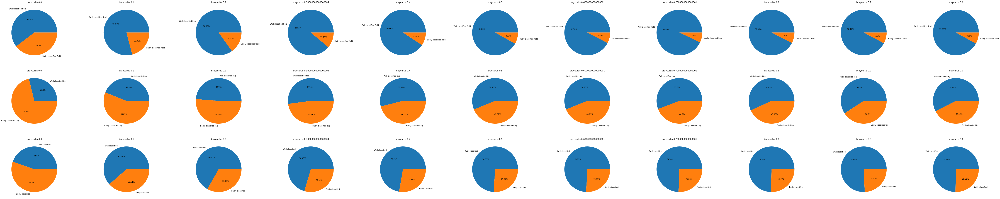

************************************************************************************************************************


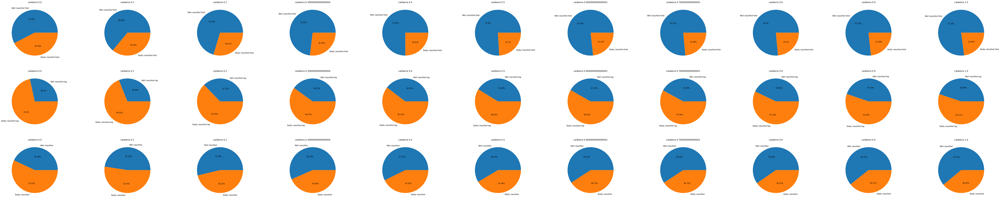

************************************************************************************************************************


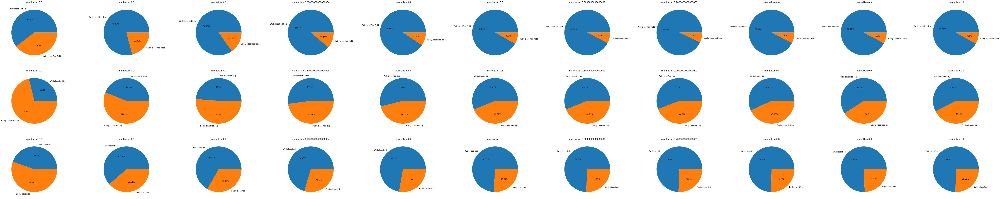

************************************************************************************************************************


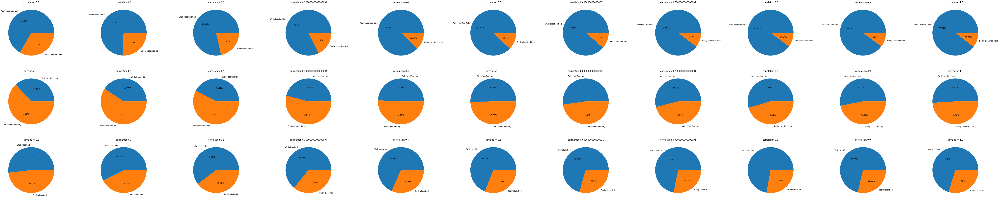

************************************************************************************************************************


In [12]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

In [13]:
field2, tag2 = similarity.evaluation2(data_eval, measures)

JSD
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
cosine
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
chebyshev
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
L2
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
minkowski
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
braycurtis
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
canberra
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
manhattan
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
correlation
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [14]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field2.values(), tag2.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
math,0.478808,0.521192,0.000000
computer,0.233808,0.766192,0.000000
physic,0.274732,0.725268,0.000000
biologie,0.287831,0.712169,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.389381,0.610619,0.000000
computer,0.180851,0.819149,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.317308,0.682692,0.000000


,Well classified field,Badly classified field,Weight
math,0.620170,0.379830,0.100000
computer,0.307488,0.692512,0.100000
physic,0.308413,0.691587,0.100000
biologie,0.355693,0.644307,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.100000
computer,0.276596,0.723404,0.100000
physic,0.366667,0.633333,0.100000
biologie,0.471154,0.528846,0.100000


,Well classified field,Badly classified field,Weight
math,0.708667,0.291333,0.200000
computer,0.381281,0.618719,0.200000
physic,0.334524,0.665476,0.200000
biologie,0.403960,0.596040,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,0.200000
computer,0.329787,0.670213,0.200000
physic,0.375000,0.625000,0.200000
biologie,0.538462,0.461538,0.200000


,Well classified field,Badly classified field,Weight
math,0.832169,0.167831,0.300000
computer,0.413086,0.586914,0.300000
physic,0.360700,0.639300,0.300000
biologie,0.442424,0.557576,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.681416,0.318584,0.300000
computer,0.361702,0.638298,0.300000
physic,0.400000,0.600000,0.300000
biologie,0.576923,0.423077,0.300000


,Well classified field,Badly classified field,Weight
math,0.902656,0.097344,0.400000
computer,0.476802,0.523198,0.400000
physic,0.361737,0.638263,0.400000
biologie,0.471087,0.528913,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.400000
computer,0.414894,0.585106,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.634615,0.365385,0.400000


,Well classified field,Badly classified field,Weight
math,0.946747,0.053253,0.500000
computer,0.518908,0.481092,0.500000
physic,0.345695,0.654305,0.500000
biologie,0.480429,0.519571,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.500000
computer,0.457447,0.542553,0.500000
physic,0.416667,0.583333,0.500000
biologie,0.692308,0.307692,0.500000


,Well classified field,Badly classified field,Weight
math,0.973218,0.026782,0.600000
computer,0.540073,0.459927,0.600000
physic,0.337363,0.662637,0.600000
biologie,0.490228,0.509772,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.752212,0.247788,0.600000
computer,0.489362,0.510638,0.600000
physic,0.458333,0.541667,0.600000
biologie,0.692308,0.307692,0.600000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.700000
computer,0.529774,0.470226,0.700000
physic,0.304514,0.695486,0.700000
biologie,0.499842,0.500158,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.743363,0.256637,0.700000
computer,0.489362,0.510638,0.700000
physic,0.483333,0.516667,0.700000
biologie,0.692308,0.307692,0.700000


,Well classified field,Badly classified field,Weight
math,0.973373,0.026627,0.800000
computer,0.540189,0.459811,0.800000
physic,0.279655,0.720345,0.800000
biologie,0.528411,0.471589,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.800000
computer,0.478723,0.521277,0.800000
physic,0.491667,0.508333,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
math,0.973374,0.026626,0.900000
computer,0.540302,0.459698,0.900000
physic,0.271458,0.728542,0.900000
biologie,0.528505,0.471495,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.489362,0.510638,0.900000
physic,0.500000,0.500000,0.900000
biologie,0.740385,0.259615,0.900000


,Well classified field,Badly classified field,Weight
math,0.964524,0.035476,1.000000
computer,0.550827,0.449173,1.000000
physic,0.254999,0.745001,1.000000
biologie,0.528413,0.471587,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.725664,0.274336,1.000000
computer,0.500000,0.500000,1.000000
physic,0.475000,0.525000,1.000000
biologie,0.711538,0.288462,1.000000


cosine


,Well classified field,Badly classified field,Weight
math,0.381698,0.618302,0.000000
computer,0.318236,0.681764,0.000000
physic,0.299868,0.700132,0.000000
biologie,0.289486,0.710514,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.424779,0.575221,0.000000
computer,0.255319,0.744681,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.365385,0.634615,0.000000


,Well classified field,Badly classified field,Weight
math,0.611006,0.388994,0.100000
computer,0.370864,0.629136,0.100000
physic,0.284243,0.715757,0.100000
biologie,0.328046,0.671954,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.451327,0.548673,0.100000
computer,0.340426,0.659574,0.100000
physic,0.300000,0.700000,0.100000
biologie,0.500000,0.500000,0.100000


,Well classified field,Badly classified field,Weight
math,0.752370,0.247630,0.200000
computer,0.360457,0.639543,0.200000
physic,0.302571,0.697429,0.200000
biologie,0.366607,0.633393,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.486726,0.513274,0.200000
computer,0.372340,0.627660,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.567308,0.432692,0.200000


,Well classified field,Badly classified field,Weight
math,0.849637,0.150363,0.300000
computer,0.445444,0.554556,0.300000
physic,0.311875,0.688125,0.300000
biologie,0.395546,0.604454,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.495575,0.504425,0.300000
computer,0.404255,0.595745,0.300000
physic,0.383333,0.616667,0.300000
biologie,0.586538,0.413462,0.300000


,Well classified field,Badly classified field,Weight
math,0.920280,0.079720,0.400000
computer,0.445898,0.554102,0.400000
physic,0.312568,0.687432,0.400000
biologie,0.433641,0.566359,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.400000
computer,0.436170,0.563830,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.653846,0.346154,0.400000


,Well classified field,Badly classified field,Weight
math,0.955520,0.044480,0.500000
computer,0.467175,0.532825,0.500000
physic,0.271387,0.728613,0.500000
biologie,0.443075,0.556925,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.500000
computer,0.446809,0.553191,0.500000
physic,0.400000,0.600000,0.500000
biologie,0.701923,0.298077,0.500000


,Well classified field,Badly classified field,Weight
math,0.955675,0.044325,0.600000
computer,0.467295,0.532705,0.600000
physic,0.263400,0.736600,0.600000
biologie,0.462029,0.537971,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.600000
computer,0.457447,0.542553,0.600000
physic,0.358333,0.641667,0.600000
biologie,0.711538,0.288462,0.600000


,Well classified field,Badly classified field,Weight
math,0.955675,0.044325,0.700000
computer,0.446695,0.553305,0.700000
physic,0.238609,0.761391,0.700000
biologie,0.480984,0.519016,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.700000
computer,0.446809,0.553191,0.700000
physic,0.341667,0.658333,0.700000
biologie,0.701923,0.298077,0.700000


,Well classified field,Badly classified field,Weight
math,0.955754,0.044246,0.800000
computer,0.457220,0.542780,0.800000
physic,0.213818,0.786182,0.800000
biologie,0.500031,0.499969,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.800000
computer,0.404255,0.595745,0.800000
physic,0.383333,0.616667,0.800000
biologie,0.673077,0.326923,0.800000


,Well classified field,Badly classified field,Weight
math,0.955831,0.044169,0.900000
computer,0.446584,0.553416,0.900000
physic,0.205485,0.794515,0.900000
biologie,0.490600,0.509400,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.900000
computer,0.414894,0.585106,0.900000
physic,0.366667,0.633333,0.900000
biologie,0.682692,0.317308,0.900000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,1.000000
computer,0.435950,0.564050,1.000000
physic,0.205485,0.794515,1.000000
biologie,0.471461,0.528539,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,1.000000
computer,0.404255,0.595745,1.000000
physic,0.350000,0.650000,1.000000
biologie,0.721154,0.278846,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
math,0.274259,0.725741,0.000000
computer,0.348915,0.651085,0.000000
physic,0.341944,0.658056,0.000000
biologie,0.167143,0.832857,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.398230,0.601770,0.000000
computer,0.212766,0.787234,0.000000
physic,0.091667,0.908333,0.000000
biologie,0.240385,0.759615,0.000000


,Well classified field,Badly classified field,Weight
math,0.686608,0.313392,0.100000
computer,0.370991,0.629009,0.100000
physic,0.384170,0.615830,0.100000
biologie,0.253335,0.746665,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.100000
computer,0.319149,0.680851,0.100000
physic,0.266667,0.733333,0.100000
biologie,0.375000,0.625000,0.100000


,Well classified field,Badly classified field,Weight
math,0.844584,0.155416,0.200000
computer,0.371446,0.628554,0.200000
physic,0.335141,0.664859,0.200000
biologie,0.339319,0.660681,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.200000
computer,0.351064,0.648936,0.200000
physic,0.308333,0.691667,0.200000
biologie,0.461538,0.538462,0.200000


,Well classified field,Badly classified field,Weight
math,0.941231,0.058769,0.300000
computer,0.372006,0.627994,0.300000
physic,0.319027,0.680973,0.300000
biologie,0.358001,0.641999,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.300000
computer,0.361702,0.638298,0.300000
physic,0.325000,0.675000,0.300000
biologie,0.548077,0.451923,0.300000


,Well classified field,Badly classified field,Weight
math,0.950393,0.049607,0.400000
computer,0.361930,0.638070,0.400000
physic,0.310766,0.689234,0.400000
biologie,0.377050,0.622950,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.400000
computer,0.361702,0.638298,0.400000
physic,0.341667,0.658333,0.400000
biologie,0.586538,0.413462,0.400000


,Well classified field,Badly classified field,Weight
math,0.950471,0.049529,0.500000
computer,0.362157,0.637843,0.500000
physic,0.286251,0.713749,0.500000
biologie,0.414868,0.585132,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.500000
computer,0.414894,0.585106,0.500000
physic,0.333333,0.666667,0.500000
biologie,0.615385,0.384615,0.500000


,Well classified field,Badly classified field,Weight
math,0.950782,0.049218,0.600000
computer,0.372682,0.627318,0.600000
physic,0.253265,0.746735,0.600000
biologie,0.443164,0.556836,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.600000
computer,0.393617,0.606383,0.600000
physic,0.358333,0.641667,0.600000
biologie,0.625000,0.375000,0.600000


,Well classified field,Badly classified field,Weight
math,0.959709,0.040291,0.700000
computer,0.351855,0.648145,0.700000
physic,0.253129,0.746871,0.700000
biologie,0.462026,0.537974,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.700000
computer,0.404255,0.595745,0.700000
physic,0.366667,0.633333,0.700000
biologie,0.625000,0.375000,0.700000


,Well classified field,Badly classified field,Weight
math,0.968635,0.031365,0.800000
computer,0.341330,0.658670,0.800000
physic,0.253199,0.746801,0.800000
biologie,0.500116,0.499884,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.800000
computer,0.404255,0.595745,0.800000
physic,0.366667,0.633333,0.800000
biologie,0.663462,0.336538,0.800000


,Well classified field,Badly classified field,Weight
math,0.959786,0.040214,0.900000
computer,0.341554,0.658446,0.900000
physic,0.253268,0.746732,0.900000
biologie,0.518979,0.481021,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.900000
computer,0.414894,0.585106,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.625000,0.375000,0.900000


,Well classified field,Badly classified field,Weight
math,0.959787,0.040213,1.000000
computer,0.331252,0.668748,1.000000
physic,0.253267,0.746733,1.000000
biologie,0.538025,0.461975,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,1.000000
computer,0.393617,0.606383,1.000000
physic,0.341667,0.658333,1.000000
biologie,0.615385,0.384615,1.000000


L2


,Well classified field,Badly classified field,Weight
math,0.381231,0.618769,0.000000
computer,0.223168,0.776832,0.000000
physic,0.324660,0.675340,0.000000
biologie,0.260176,0.739824,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.380531,0.619469,0.000000
computer,0.234043,0.765957,0.000000
physic,0.108333,0.891667,0.000000
biologie,0.317308,0.682692,0.000000


,Well classified field,Badly classified field,Weight
math,0.689098,0.310902,0.100000
computer,0.339401,0.660599,0.100000
physic,0.376049,0.623951,0.100000
biologie,0.328228,0.671772,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.100000
computer,0.340426,0.659574,0.100000
physic,0.358333,0.641667,0.100000
biologie,0.548077,0.451923,0.100000


,Well classified field,Badly classified field,Weight
math,0.838611,0.161389,0.200000
computer,0.381960,0.618040,0.200000
physic,0.335975,0.664025,0.200000
biologie,0.404878,0.595122,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.200000
computer,0.340426,0.659574,0.200000
physic,0.366667,0.633333,0.200000
biologie,0.567308,0.432692,0.200000


,Well classified field,Badly classified field,Weight
math,0.900481,0.099519,0.300000
computer,0.393159,0.606841,0.300000
physic,0.320070,0.679930,0.300000
biologie,0.424114,0.575886,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.300000
computer,0.351064,0.648936,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,0.935724,0.064276,0.400000
computer,0.414441,0.585559,0.400000
physic,0.287222,0.712778,0.400000
biologie,0.462301,0.537699,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.400000
computer,0.340426,0.659574,0.400000
physic,0.358333,0.641667,0.400000
biologie,0.644231,0.355769,0.400000


,Well classified field,Badly classified field,Weight
math,0.953424,0.046576,0.500000
computer,0.424972,0.575028,0.500000
physic,0.254237,0.745763,0.500000
biologie,0.471826,0.528174,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.500000
computer,0.361702,0.638298,0.500000
physic,0.350000,0.650000,0.500000
biologie,0.644231,0.355769,0.500000


,Well classified field,Badly classified field,Weight
math,0.953424,0.046576,0.600000
computer,0.446135,0.553865,0.600000
physic,0.254306,0.745694,0.600000
biologie,0.471917,0.528083,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.600000
computer,0.382979,0.617021,0.600000
physic,0.383333,0.616667,0.600000
biologie,0.634615,0.365385,0.600000


,Well classified field,Badly classified field,Weight
math,0.953191,0.046809,0.700000
computer,0.446247,0.553753,0.700000
physic,0.229582,0.770418,0.700000
biologie,0.462395,0.537605,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.700000
computer,0.393617,0.606383,0.700000
physic,0.366667,0.633333,0.700000
biologie,0.644231,0.355769,0.700000


,Well classified field,Badly classified field,Weight
math,0.953346,0.046654,0.800000
computer,0.467299,0.532701,0.800000
physic,0.237846,0.762154,0.800000
biologie,0.452872,0.547128,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.800000
computer,0.382979,0.617021,0.800000
physic,0.350000,0.650000,0.800000
biologie,0.663462,0.336538,0.800000


,Well classified field,Badly classified field,Weight
math,0.953346,0.046654,0.900000
computer,0.456663,0.543337,0.900000
physic,0.237846,0.762154,0.900000
biologie,0.471826,0.528174,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,0.900000
computer,0.393617,0.606383,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.644231,0.355769,0.900000


,Well classified field,Badly classified field,Weight
math,0.953346,0.046654,1.000000
computer,0.435949,0.564051,1.000000
physic,0.229582,0.770418,1.000000
biologie,0.462211,0.537789,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,1.000000
computer,0.393617,0.606383,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.653846,0.346154,1.000000


minkowski


,Well classified field,Badly classified field,Weight
math,0.319130,0.680870,0.000000
computer,0.265158,0.734842,0.000000
physic,0.358059,0.641941,0.000000
biologie,0.232523,0.767477,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.371681,0.628319,0.000000
computer,0.244681,0.755319,0.000000
physic,0.100000,0.900000,0.000000
biologie,0.298077,0.701923,0.000000


,Well classified field,Badly classified field,Weight
math,0.722937,0.277063,0.100000
computer,0.329106,0.670894,0.100000
physic,0.376116,0.623884,0.100000
biologie,0.329330,0.670670,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.100000
computer,0.351064,0.648936,0.100000
physic,0.308333,0.691667,0.100000
biologie,0.423077,0.576923,0.100000


,Well classified field,Badly classified field,Weight
math,0.846060,0.153940,0.200000
computer,0.350833,0.649167,0.200000
physic,0.327365,0.672635,0.200000
biologie,0.405613,0.594387,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.200000
computer,0.329787,0.670213,0.200000
physic,0.350000,0.650000,0.200000
biologie,0.548077,0.451923,0.200000


,Well classified field,Badly classified field,Weight
math,0.907700,0.092300,0.300000
computer,0.372225,0.627775,0.300000
physic,0.294725,0.705275,0.300000
biologie,0.415142,0.584858,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.300000
computer,0.404255,0.595745,0.300000
physic,0.383333,0.616667,0.300000
biologie,0.596154,0.403846,0.300000


,Well classified field,Badly classified field,Weight
math,0.934325,0.065675,0.400000
computer,0.393505,0.606495,0.400000
physic,0.287013,0.712987,0.400000
biologie,0.452961,0.547039,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.400000
computer,0.404255,0.595745,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.634615,0.365385,0.400000


,Well classified field,Badly classified field,Weight
math,0.951869,0.048131,0.500000
computer,0.382982,0.617018,0.500000
physic,0.270486,0.729514,0.500000
biologie,0.472281,0.527719,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.500000
computer,0.436170,0.563830,0.500000
physic,0.358333,0.641667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,0.943098,0.056902,0.600000
computer,0.393621,0.606379,0.600000
physic,0.253958,0.746042,0.600000
biologie,0.453143,0.546857,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.600000
computer,0.468085,0.531915,0.600000
physic,0.350000,0.650000,0.600000
biologie,0.653846,0.346154,0.600000


,Well classified field,Badly classified field,Weight
math,0.943177,0.056823,0.700000
computer,0.404371,0.595629,0.700000
physic,0.254028,0.745972,0.700000
biologie,0.472282,0.527718,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.700000
computer,0.446809,0.553191,0.700000
physic,0.358333,0.641667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,0.943177,0.056823,0.800000
computer,0.404484,0.595516,0.800000
physic,0.254166,0.745834,0.800000
biologie,0.472097,0.527903,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.800000
computer,0.436170,0.563830,0.800000
physic,0.358333,0.641667,0.800000
biologie,0.673077,0.326923,0.800000


,Well classified field,Badly classified field,Weight
math,0.951793,0.048207,0.900000
computer,0.393960,0.606040,0.900000
physic,0.237570,0.762430,0.900000
biologie,0.481619,0.518381,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.900000
computer,0.414894,0.585106,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.682692,0.317308,0.900000


,Well classified field,Badly classified field,Weight
math,0.951870,0.048130,1.000000
computer,0.415009,0.584991,1.000000
physic,0.229375,0.770625,1.000000
biologie,0.491050,0.508950,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,1.000000
computer,0.404255,0.595745,1.000000
physic,0.358333,0.641667,1.000000
biologie,0.653846,0.346154,1.000000


braycurtis


,Well classified field,Badly classified field,Weight
math,0.523291,0.476709,0.000000
computer,0.223732,0.776268,0.000000
physic,0.274525,0.725475,0.000000
biologie,0.316677,0.683323,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.460177,0.539823,0.000000
computer,0.223404,0.776596,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.326923,0.673077,0.000000


,Well classified field,Badly classified field,Weight
math,0.673500,0.326500,0.100000
computer,0.308163,0.691837,0.100000
physic,0.300156,0.699844,0.100000
biologie,0.393971,0.606029,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.100000
computer,0.340426,0.659574,0.100000
physic,0.316667,0.683333,0.100000
biologie,0.480769,0.519231,0.100000


,Well classified field,Badly classified field,Weight
math,0.753226,0.246774,0.200000
computer,0.381955,0.618045,0.200000
physic,0.342585,0.657415,0.200000
biologie,0.423190,0.576810,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.672566,0.327434,0.200000
computer,0.329787,0.670213,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
math,0.867648,0.132352,0.300000
computer,0.455749,0.544251,0.300000
physic,0.360840,0.639160,0.300000
biologie,0.451856,0.548144,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.300000
computer,0.404255,0.595745,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,0.929284,0.070716,0.400000
computer,0.508717,0.491283,0.400000
physic,0.361738,0.638262,0.400000
biologie,0.461290,0.538710,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.400000
computer,0.414894,0.585106,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.615385,0.384615,0.400000


,Well classified field,Badly classified field,Weight
math,0.964447,0.035553,0.500000
computer,0.529656,0.470344,0.500000
physic,0.353613,0.646387,0.500000
biologie,0.499385,0.500615,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.500000
computer,0.468085,0.531915,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,0.973296,0.026704,0.600000
computer,0.550708,0.449292,0.600000
physic,0.329097,0.670903,0.600000
biologie,0.499387,0.500613,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.600000
computer,0.457447,0.542553,0.600000
physic,0.433333,0.566667,0.600000
biologie,0.663462,0.336538,0.600000


,Well classified field,Badly classified field,Weight
math,0.973296,0.026704,0.700000
computer,0.571758,0.428242,0.700000
physic,0.304306,0.695694,0.700000
biologie,0.499386,0.500614,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.700000
computer,0.425532,0.574468,0.700000
physic,0.433333,0.566667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,0.973374,0.026626,0.800000
computer,0.571873,0.428127,0.800000
physic,0.271250,0.728750,0.800000
biologie,0.499659,0.500341,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.800000
computer,0.414894,0.585106,0.800000
physic,0.466667,0.533333,0.800000
biologie,0.692308,0.307692,0.800000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.900000
computer,0.561350,0.438650,0.900000
physic,0.254722,0.745278,0.900000
biologie,0.490044,0.509956,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.446809,0.553191,0.900000
physic,0.475000,0.525000,0.900000
biologie,0.711538,0.288462,0.900000


,Well classified field,Badly classified field,Weight
math,0.955753,0.044247,1.000000
computer,0.571875,0.428125,1.000000
physic,0.221667,0.778333,1.000000
biologie,0.490228,0.509772,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
physic,0.441667,0.558333,1.000000
biologie,0.711538,0.288462,1.000000


canberra


,Well classified field,Badly classified field,Weight
math,0.585237,0.414763,0.000000
computer,0.276925,0.723075,0.000000
physic,0.224804,0.775196,0.000000
biologie,0.393048,0.606952,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.000000
computer,0.159574,0.840426,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.259615,0.740385,0.000000


,Well classified field,Badly classified field,Weight
math,0.612485,0.387515,0.100000
computer,0.318802,0.681198,0.100000
physic,0.258344,0.741656,0.100000
biologie,0.421711,0.578289,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.100000
computer,0.180851,0.819149,0.100000
physic,0.191667,0.808333,0.100000
biologie,0.326923,0.673077,0.100000


,Well classified field,Badly classified field,Weight
math,0.691893,0.308107,0.200000
computer,0.350370,0.649630,0.200000
physic,0.283415,0.716585,0.200000
biologie,0.402848,0.597152,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.200000
computer,0.234043,0.765957,0.200000
physic,0.283333,0.716667,0.200000
biologie,0.394231,0.605769,0.200000


,Well classified field,Badly classified field,Weight
math,0.735985,0.264015,0.300000
computer,0.360894,0.639106,0.300000
physic,0.308554,0.691446,0.300000
biologie,0.412552,0.587448,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.300000
computer,0.255319,0.744681,0.300000
physic,0.375000,0.625000,0.300000
biologie,0.413462,0.586538,0.300000


,Well classified field,Badly classified field,Weight
math,0.779842,0.220158,0.400000
computer,0.361115,0.638885,0.400000
physic,0.317027,0.682973,0.400000
biologie,0.422351,0.577649,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.400000
computer,0.297872,0.702128,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.365385,0.634615,0.400000


,Well classified field,Badly classified field,Weight
math,0.806079,0.193921,0.500000
computer,0.392579,0.607421,0.500000
physic,0.309039,0.690961,0.500000
biologie,0.413193,0.586807,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.500000
computer,0.340426,0.659574,0.500000
physic,0.400000,0.600000,0.500000
biologie,0.384615,0.615385,0.500000


,Well classified field,Badly classified field,Weight
math,0.770839,0.229161,0.600000
computer,0.424042,0.575958,0.600000
physic,0.325637,0.674363,0.600000
biologie,0.413194,0.586806,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.600000
computer,0.308511,0.691489,0.600000
physic,0.416667,0.583333,0.600000
biologie,0.413462,0.586538,0.600000


,Well classified field,Badly classified field,Weight
math,0.752987,0.247013,0.700000
computer,0.445091,0.554909,0.700000
physic,0.333968,0.666032,0.700000
biologie,0.413011,0.586989,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.700000
computer,0.329787,0.670213,0.700000
physic,0.408333,0.591667,0.700000
biologie,0.403846,0.596154,0.700000


,Well classified field,Badly classified field,Weight
math,0.700125,0.299875,0.800000
computer,0.423819,0.576181,0.800000
physic,0.325843,0.674157,0.800000
biologie,0.413101,0.586899,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.800000
computer,0.319149,0.680851,0.800000
physic,0.425000,0.575000,0.800000
biologie,0.403846,0.596154,0.800000


,Well classified field,Badly classified field,Weight
math,0.664730,0.335270,0.900000
computer,0.413182,0.586818,0.900000
physic,0.334244,0.665756,0.900000
biologie,0.403578,0.596422,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.900000
computer,0.308511,0.691489,0.900000
physic,0.400000,0.600000,0.900000
biologie,0.461538,0.538462,0.900000


,Well classified field,Badly classified field,Weight
math,0.603175,0.396825,1.000000
computer,0.402433,0.597567,1.000000
physic,0.342508,0.657492,1.000000
biologie,0.394239,0.605761,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,1.000000
computer,0.329787,0.670213,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.471154,0.528846,1.000000


manhattan


,Well classified field,Badly classified field,Weight
math,0.523291,0.476709,0.000000
computer,0.223732,0.776268,0.000000
physic,0.274525,0.725475,0.000000
biologie,0.316677,0.683323,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.460177,0.539823,0.000000
computer,0.223404,0.776596,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.326923,0.673077,0.000000


,Well classified field,Badly classified field,Weight
math,0.673500,0.326500,0.100000
computer,0.308163,0.691837,0.100000
physic,0.300156,0.699844,0.100000
biologie,0.393971,0.606029,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.100000
computer,0.340426,0.659574,0.100000
physic,0.316667,0.683333,0.100000
biologie,0.480769,0.519231,0.100000


,Well classified field,Badly classified field,Weight
math,0.753226,0.246774,0.200000
computer,0.381955,0.618045,0.200000
physic,0.342585,0.657415,0.200000
biologie,0.423190,0.576810,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.672566,0.327434,0.200000
computer,0.329787,0.670213,0.200000
physic,0.341667,0.658333,0.200000
biologie,0.605769,0.394231,0.200000


,Well classified field,Badly classified field,Weight
math,0.867648,0.132352,0.300000
computer,0.455749,0.544251,0.300000
physic,0.360840,0.639160,0.300000
biologie,0.451856,0.548144,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.300000
computer,0.404255,0.595745,0.300000
physic,0.366667,0.633333,0.300000
biologie,0.615385,0.384615,0.300000


,Well classified field,Badly classified field,Weight
math,0.929284,0.070716,0.400000
computer,0.508717,0.491283,0.400000
physic,0.361738,0.638262,0.400000
biologie,0.461290,0.538710,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.761062,0.238938,0.400000
computer,0.414894,0.585106,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.615385,0.384615,0.400000


,Well classified field,Badly classified field,Weight
math,0.964447,0.035553,0.500000
computer,0.529656,0.470344,0.500000
physic,0.353613,0.646387,0.500000
biologie,0.499385,0.500615,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.500000
computer,0.468085,0.531915,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,0.973296,0.026704,0.600000
computer,0.550708,0.449292,0.600000
physic,0.329097,0.670903,0.600000
biologie,0.499387,0.500613,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.600000
computer,0.457447,0.542553,0.600000
physic,0.433333,0.566667,0.600000
biologie,0.663462,0.336538,0.600000


,Well classified field,Badly classified field,Weight
math,0.973296,0.026704,0.700000
computer,0.571758,0.428242,0.700000
physic,0.304306,0.695694,0.700000
biologie,0.499386,0.500614,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.700000
computer,0.425532,0.574468,0.700000
physic,0.433333,0.566667,0.700000
biologie,0.682692,0.317308,0.700000


,Well classified field,Badly classified field,Weight
math,0.973374,0.026626,0.800000
computer,0.571873,0.428127,0.800000
physic,0.271250,0.728750,0.800000
biologie,0.499659,0.500341,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.800000
computer,0.414894,0.585106,0.800000
physic,0.466667,0.533333,0.800000
biologie,0.692308,0.307692,0.800000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.900000
computer,0.561350,0.438650,0.900000
physic,0.254722,0.745278,0.900000
biologie,0.490044,0.509956,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.900000
computer,0.446809,0.553191,0.900000
physic,0.475000,0.525000,0.900000
biologie,0.711538,0.288462,0.900000


,Well classified field,Badly classified field,Weight
math,0.955753,0.044247,1.000000
computer,0.571875,0.428125,1.000000
physic,0.221667,0.778333,1.000000
biologie,0.490228,0.509772,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,1.000000
computer,0.446809,0.553191,1.000000
physic,0.441667,0.558333,1.000000
biologie,0.711538,0.288462,1.000000


correlation


,Well classified field,Badly classified field,Weight
math,0.285680,0.714320,0.000000
computer,0.444991,0.555009,0.000000
physic,0.240847,0.759153,0.000000
biologie,0.394892,0.605108,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.495575,0.504425,0.000000
computer,0.361702,0.638298,0.000000
physic,0.116667,0.883333,0.000000
biologie,0.500000,0.500000,0.000000


,Well classified field,Badly classified field,Weight
math,0.488207,0.511793,0.100000
computer,0.455631,0.544369,0.100000
physic,0.241476,0.758524,0.100000
biologie,0.394987,0.605013,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.100000
computer,0.372340,0.627660,0.100000
physic,0.183333,0.816667,0.100000
biologie,0.548077,0.451923,0.100000


,Well classified field,Badly classified field,Weight
math,0.769679,0.230321,0.200000
computer,0.477241,0.522759,0.200000
physic,0.226402,0.773598,0.200000
biologie,0.423928,0.576072,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.530973,0.469027,0.200000
computer,0.382979,0.617021,0.200000
physic,0.216667,0.783333,0.200000
biologie,0.557692,0.442308,0.200000


,Well classified field,Badly classified field,Weight
math,0.884414,0.115586,0.300000
computer,0.498632,0.501368,0.300000
physic,0.219729,0.780271,0.300000
biologie,0.424023,0.575977,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.300000
computer,0.414894,0.585106,0.300000
physic,0.283333,0.716667,0.300000
biologie,0.586538,0.413462,0.300000


,Well classified field,Badly classified field,Weight
math,0.928896,0.071104,0.400000
computer,0.540623,0.459377,0.400000
physic,0.220974,0.779026,0.400000
biologie,0.414778,0.585222,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.400000
computer,0.425532,0.574468,0.400000
physic,0.316667,0.683333,0.400000
biologie,0.653846,0.346154,0.400000


,Well classified field,Badly classified field,Weight
math,0.955521,0.044479,0.500000
computer,0.519914,0.480086,0.500000
physic,0.213332,0.786668,0.500000
biologie,0.452871,0.547129,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.500000
computer,0.468085,0.531915,0.500000
physic,0.300000,0.700000,0.500000
biologie,0.653846,0.346154,0.500000


,Well classified field,Badly classified field,Weight
math,0.973141,0.026859,0.600000
computer,0.520028,0.479972,0.600000
physic,0.230138,0.769862,0.600000
biologie,0.452871,0.547129,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.600000
computer,0.468085,0.531915,0.600000
physic,0.300000,0.700000,0.600000
biologie,0.721154,0.278846,0.600000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.700000
computer,0.499429,0.500571,0.700000
physic,0.238541,0.761459,0.700000
biologie,0.443165,0.556835,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.700000
computer,0.457447,0.542553,0.700000
physic,0.300000,0.700000,0.700000
biologie,0.740385,0.259615,0.700000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.800000
computer,0.467855,0.532145,0.800000
physic,0.222013,0.777987,0.800000
biologie,0.471644,0.528356,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.690265,0.309735,0.800000
computer,0.468085,0.531915,0.800000
physic,0.300000,0.700000,0.800000
biologie,0.721154,0.278846,0.800000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.900000
computer,0.457108,0.542892,0.900000
physic,0.213818,0.786182,0.900000
biologie,0.471370,0.528630,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.681416,0.318584,0.900000
computer,0.404255,0.595745,0.900000
physic,0.333333,0.666667,0.900000
biologie,0.701923,0.298077,0.900000


,Well classified field,Badly classified field,Weight
math,0.964757,0.035243,1.000000
computer,0.446359,0.553641,1.000000
physic,0.222082,0.777918,1.000000
biologie,0.461754,0.538246,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,1.000000
computer,0.404255,0.595745,1.000000
physic,0.341667,0.658333,1.000000
biologie,0.701923,0.298077,1.000000


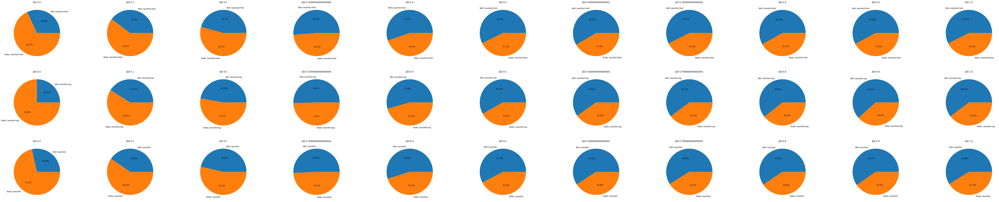

************************************************************************************************************************


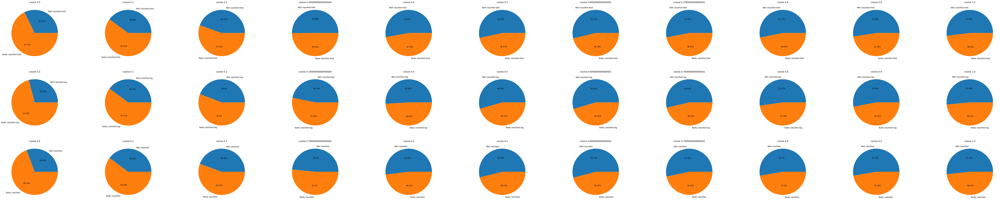

************************************************************************************************************************


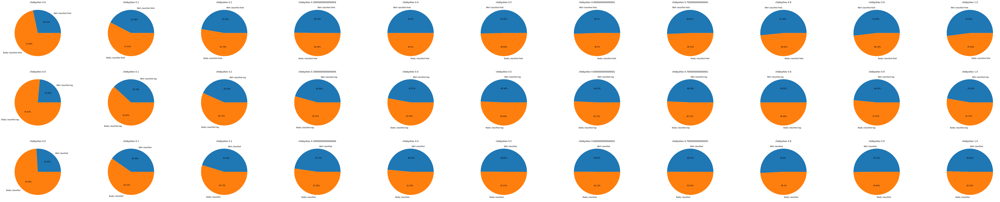

************************************************************************************************************************


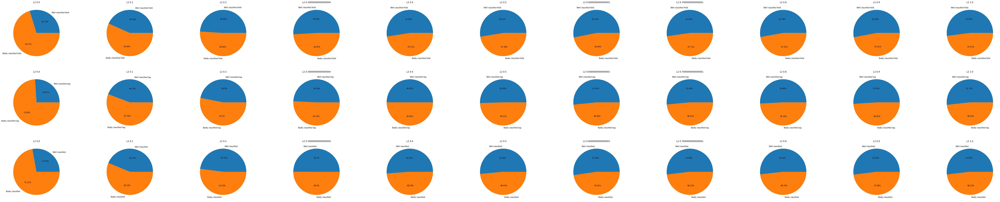

************************************************************************************************************************


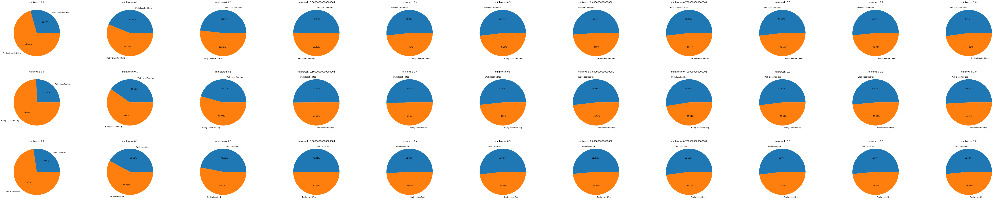

************************************************************************************************************************


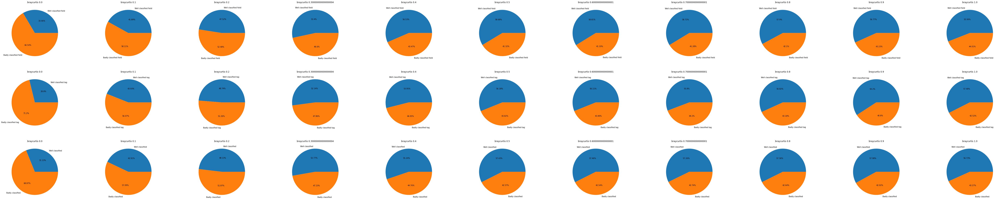

************************************************************************************************************************


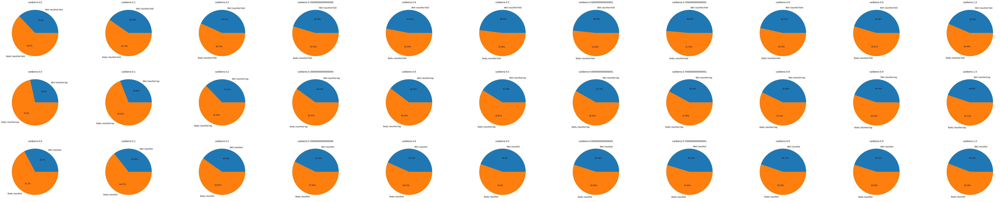

************************************************************************************************************************


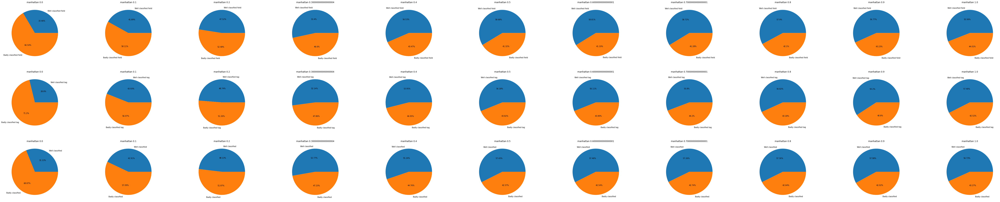

************************************************************************************************************************


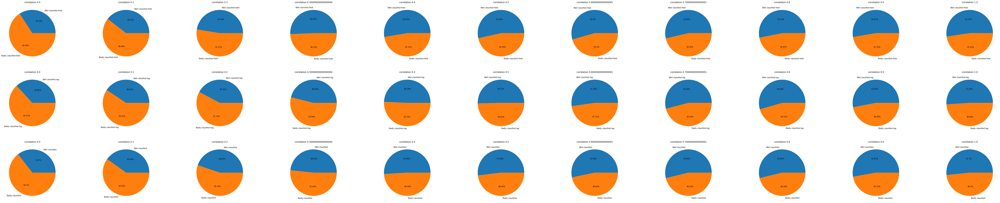

************************************************************************************************************************


In [15]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

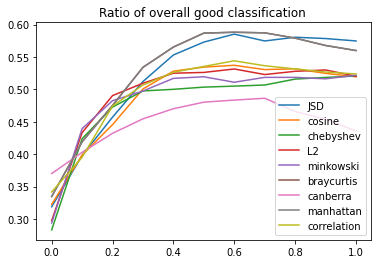

In [16]:
for measure in measures:
    temp = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie[measure],classified_tag_pie[measure])]
    plt.plot(np.linspace(0,1,11),temp,label = measure)
plt.legend() 
plt.title("Ratio of overall good classification ")
plt.show()

In [20]:
best_measure = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie["manhattan"],classified_tag_pie["manhattan"])]
best_measure

[0.33455638289285566,
 0.41894747549904626,
 0.4752390956446604,
 0.5340234796844365,
 0.5652569732599122,
 0.5867752180404614,
 0.5881218647213909,
 0.5871863030364834,
 0.5790393413008162,
 0.5676795966772212,
 0.5598806203623146]

In [21]:
with open('Saved Data/best_measure3_V3', 'wb') as f:
    pickle.dump(best_measure, f)

In [ ]:
fig, ax = similarity.repartition_similarity(data_eval, measures)

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,

In [ ]:
fig.savefig("Saved Data/repartition3_V3")